# Secondary-state joint campaign DOE

This notebook summarizes the extended fermentation DOE pipeline with pyruvate, acetaldehyde, acetate, dissolved oxygen exposure, CO2, liquid aroma measurements, and final condensate constraints.

In [1]:
from pathlib import Path
import pandas as pd
from IPython.display import Image, display

ROOT = Path.cwd()
if not (ROOT / 'results').exists() and (ROOT / 'fermentation_model').exists():
    ROOT = ROOT / 'fermentation_model'
RESULTS = ROOT / 'results/secondary_joint_campaign_doe'
fit = pd.read_csv(RESULTS / 'secondary_fit_summary.csv')
estim = pd.read_csv(RESULTS / 'current_prior_estimability.csv')
ranking = pd.read_csv(RESULTS / 'candidate_ranking.csv')
selected = pd.read_csv(RESULTS / 'selected_campaigns.csv')
display(fit)
display(estim.sort_values(['analysis','classification','std_log_approx']).head(40))

,fit,success,status,message,nfev,initial_wsse,final_wsse,n_residuals,wsse_per_residual
0,secondary_current_l2,True,2,`ftol` termination condition is satisfied.,23,24922.989235,8713.719494,591,14.744026


,analysis,parameter,theta,std_log_approx,approx_95_multiplier,active_bound,classification
28,current_prior,alpha_EA_loss,1.000000,0.749998,4.349215e+00,False,moderate
29,current_prior,alpha_IAA_loss,1.000000,0.749998,4.349215e+00,False,moderate
30,current_prior,alpha_EO_loss,1.000000,0.749998,4.349215e+00,False,moderate
20,current_prior,kLaO2,0.001501,1.067173,8.098345e+00,False,weak_but_actionable
21,current_prior,O2sat,2.713015,1.221704,1.096315e+01,False,weak_but_actionable
22,current_prior,k_EA_growth,0.100000,1.249989,1.158810e+01,False,weak_but_actionable
23,current_prior,k_EA_stationary,0.280000,1.249989,1.158810e+01,False,weak_but_actionable
24,current_prior,k_IAA_growth,0.003000,1.249989,1.158810e+01,False,weak_but_actionable
25,current_prior,k_IAA_stationary,0.012000,1.249989,1.158810e+01,False,weak_but_actionable
26,current_prior,k_EO_growth,0.000800,1.249989,1.158810e+01,False,weak_but_actionable


## Candidate ranking

The ranking combines current-data prior information with future outputs. Liquid samples are limited to operational hours; CO2 is treated as online; O2 is measured on the operational early-time grid and is not optimized as a controlled input.

In [2]:
display(ranking.sort_values('hybrid_score', ascending=False).head(20))
display(selected)

,candidate,family,medium,horizon_h,hybrid_score,dopt_score,new_logdet,new_min_eigenvalue,new_max_eigenvalue,new_min_relative_eigenvalue,...,var_ratio_k_EO_stationary,var_reduction_k_EO_stationary,var_ratio_alpha_EA_loss,var_reduction_alpha_EA_loss,var_ratio_alpha_IAA_loss,var_reduction_alpha_IAA_loss,var_ratio_alpha_EO_loss,var_reduction_alpha_EO_loss,new_param_mean_var_reduction,new_param_worst_var_reduction
8,synthetic_fructose_rich_glucose_pulse,sugar_separation,synthetic,216.0,117.584882,163.733529,88.187119,2.218658e-08,56473.586964,3.928666e-13,...,0.001362,0.998638,0.409731,0.590269,0.353869,0.646131,0.275231,0.724769,0.608474,0.101458
9,synthetic_glucose_rich_fructose_pulse,sugar_separation,synthetic,216.0,116.186340,162.182189,84.231795,2.076855e-08,41947.469738,4.951086e-13,...,0.001280,0.998720,0.324450,0.675550,0.279826,0.720174,0.220503,0.779497,0.615961,0.108066
11,synthetic_high_sugar_reference,synthetic_baseline,synthetic,216.0,114.385622,160.465646,88.800868,1.072323e-08,49682.655367,2.158344e-13,...,0.001177,0.998823,0.368544,0.631456,0.337534,0.662466,0.286894,0.713106,0.610384,0.120305
17,synthetic_viable_biomass_step,biomass_input,synthetic,216.0,113.945085,159.270005,95.639513,1.117053e-08,29730.168637,3.757303e-13,...,0.001957,0.998043,0.541489,0.458511,0.454194,0.545806,0.334619,0.665381,0.634045,0.114251
10,synthetic_high_biomass_low_N_maintenance,maintenance,synthetic,216.0,110.034947,155.018572,70.965120,8.100751e-10,26752.884520,3.027992e-14,...,0.000578,0.999422,0.296354,0.703646,0.241216,0.758784,0.195480,0.804520,0.531958,0.102774
4,natural_glucose_pulse_after_growth,natural_sugar_pulse,natural,216.0,109.596731,155.667245,73.804506,3.366523e-06,21586.789962,1.559529e-10,...,0.001808,0.998192,0.479568,0.520432,0.400630,0.599370,0.299430,0.700570,0.496866,0.090360
6,synthetic_ethanol_inhibition_challenge,ethanol_inhibition,synthetic,216.0,108.447081,154.351850,75.969586,1.707547e-08,23370.131113,7.306535e-13,...,0.001604,0.998396,0.555890,0.444110,0.496723,0.503277,0.424862,0.575138,0.556160,0.081850
15,synthetic_natural_like_control,synthetic_baseline,synthetic,216.0,108.326215,154.245934,55.732223,-2.719623e-13,20777.104501,-1.308952e-17,...,0.002384,0.997616,0.730950,0.269050,0.649740,0.350260,0.516505,0.483495,0.565464,0.120527
12,synthetic_late_ethanol_death_probe,death,synthetic,216.0,108.248372,154.294902,72.997855,2.715701e-09,17227.404531,1.576385e-13,...,0.002135,0.997865,0.551886,0.448114,0.454514,0.545486,0.340249,0.659751,0.562607,0.134039
2,natural_cold_hot_switch,natural_temperature,natural,216.0,107.312343,152.863849,57.787236,7.963499e-14,19075.753012,4.174671e-18,...,0.002786,0.997214,0.737032,0.262968,0.656022,0.343978,0.514838,0.485162,0.455687,0.071955


,objective,campaign_order,candidate,family,medium,horizon_h,temperature_segments,score,rationale,campaign_logdet,...,var_ratio_k_EO_stationary,var_reduction_k_EO_stationary,var_ratio_alpha_EA_loss,var_reduction_alpha_EA_loss,var_ratio_alpha_IAA_loss,var_reduction_alpha_IAA_loss,var_ratio_alpha_EO_loss,var_reduction_alpha_EO_loss,new_param_mean_var_reduction,new_param_worst_var_reduction
0,hybrid,1,synthetic_fructose_rich_glucose_pulse,sugar_separation,synthetic,216.0,"17, 20, 23, 20",117.584882,Fructose-rich run probes iG and fructose kinet...,163.733529,...,0.001362,0.998638,0.409731,0.590269,0.353869,0.646131,0.275231,0.724769,0.608474,0.101458
1,hybrid,2,synthetic_high_biomass_low_N_maintenance,maintenance,synthetic,216.0,"16, 18, 20, 18",132.840751,High biomass with low N creates low-growth sug...,178.240471,...,0.000353,0.999647,0.191274,0.808726,0.159575,0.840425,0.123361,0.876639,0.762202,0.181904
2,hybrid,3,synthetic_glucose_rich_fructose_pulse,sugar_separation,synthetic,216.0,"17, 20, 23, 20",139.440740,High glucose plus fructose pulse separates glu...,185.061923,...,0.000262,0.999738,0.122887,0.877113,0.104875,0.895125,0.081087,0.918913,0.789593,0.248308
3,hybrid,4,natural_cold_hot_switch,natural_temperature,natural,216.0,"15, 18, 23, 20",144.396024,Natural matrix with temperature excitation and...,189.003389,...,0.000246,0.999754,0.116494,0.883506,0.099147,0.900853,0.075163,0.924837,0.820493,0.324341
4,hybrid,5,synthetic_viable_biomass_step,biomass_input,synthetic,216.0,"18, 22, 22, 18",147.969314,Known viable biomass addition tests rate propo...,192.627943,...,0.000219,0.999781,0.105363,0.894637,0.087513,0.912487,0.063651,0.936349,0.838914,0.383326
5,hybrid,6,natural_aroma_matrix_cold_hot,natural_aroma_matrix,natural,216.0,"14, 18, 24, 19",151.142873,Natural-matrix temperature excitation tests wh...,195.229310,...,0.000208,0.999792,0.100853,0.899147,0.083240,0.916760,0.059531,0.940469,0.855233,0.431966
6,hybrid,7,synthetic_high_sugar_reference,synthetic_baseline,synthetic,216.0,"18, 20, 20, 18",153.865099,Synthetic high-sugar operating point close to ...,198.200891,...,0.000178,0.999822,0.084826,0.915174,0.070862,0.929138,0.050803,0.949197,0.864098,0.468064
7,hybrid,8,natural_glucose_pulse_after_growth,natural_sugar_pulse,natural,216.0,"18, 20, 22, 19",156.301536,Natural must with glucose perturbation to test...,200.466635,...,0.000163,0.999837,0.077080,0.922920,0.063454,0.936546,0.044763,0.955237,0.875653,0.510351
8,hybrid,9,synthetic_pyruvate_peak_lowN_warm_shift,secondary_pyruvate,synthetic,216.0,"16, 18, 24, 20",158.223662,Low initial YAN plus warm shift targets pyruva...,202.513712,...,0.000134,0.999866,0.067219,0.932781,0.055075,0.944925,0.039129,0.960871,0.881262,0.528046
9,d_opt,1,synthetic_fructose_rich_glucose_pulse,sugar_separation,synthetic,216.0,"17, 20, 23, 20",163.733529,Fructose-rich run probes iG and fructose kinet...,163.733529,...,0.001362,0.998638,0.409731,0.590269,0.353869,0.646131,0.275231,0.724769,0.608474,0.101458


## Eigenvalue diagnostics

In [3]:
spectrum = pd.read_csv(RESULTS / 'campaign_eigen_spectrum.csv')
loadings = pd.read_csv(RESULTS / 'campaign_weak_loadings.csv')
display(spectrum.groupby('analysis').head(6))
display(loadings)

,analysis,direction,eigenvalue,relative_eigenvalue
0,hybrid,1,0.000120,3.007219e-10
1,hybrid,2,0.203573,5.116312e-07
2,hybrid,3,0.939851,2.362088e-06
3,hybrid,4,1.473093,3.702261e-06
4,hybrid,5,19.225862,4.831954e-05
5,hybrid,6,26.239215,6.594590e-05
31,dopt_greedy,1,0.000120,3.007219e-10
32,dopt_greedy,2,0.203573,5.116312e-07
33,dopt_greedy,3,0.939851,2.362088e-06
34,dopt_greedy,4,1.473093,3.702261e-06


,analysis,weak_direction,eigenvalue,dominant_parameters,dominant_abs_loadings
0,hybrid,1,0.000120,"kAcAssim, kAldPyr, kAldRed, O2sat, kAcStress, ...","1.000, 0.001, 0.001, 0.000, 0.000, 0.000, 0.00..."
1,hybrid,2,0.203573,"kAldPyr, kAldRed, O2sat, kAcAld, gammaF0, kLaO...","0.917, 0.397, 0.039, 0.009, 0.007, 0.006, 0.00..."
2,hybrid,3,0.939851,"gammaF0, kAldRed, gammaG0, O2sat, betaF0, iG, ...","1.000, 0.022, 0.012, 0.003, 0.002, 0.002, 0.00..."
3,hybrid,4,1.473093,"kAldRed, kAldPyr, O2sat, kLaO2, gammaF0, kAcAl...","0.901, 0.396, 0.144, 0.098, 0.021, 0.012, 0.00..."
4,hybrid,5,19.225862,"O2sat, kLaO2, qO2, kAldRed, alpha_EA_loss, kAl...","0.903, 0.402, 0.116, 0.098, 0.009, 0.006, 0.00..."
5,hybrid,6,26.239215,"alpha_EA_loss, k_EA_stationary, alpha_IAA_loss...","0.995, 0.078, 0.047, 0.039, 0.017, 0.008, 0.00..."
6,hybrid,7,31.917689,"alpha_IAA_loss, k_IAA_growth, k_IAA_stationary...","0.992, 0.080, 0.080, 0.048, 0.027, 0.006, 0.00..."
7,hybrid,8,44.983300,"alpha_EO_loss, k_EO_stationary, k_EO_growth, a...","0.994, 0.086, 0.064, 0.028, 0.016, 0.008, 0.00..."
8,dopt_greedy,1,0.000120,"kAcAssim, kAldPyr, kAldRed, O2sat, kAcStress, ...","1.000, 0.001, 0.001, 0.000, 0.000, 0.000, 0.00..."
9,dopt_greedy,2,0.203573,"kAldPyr, kAldRed, O2sat, kAcAld, gammaF0, kLaO...","0.917, 0.397, 0.039, 0.009, 0.007, 0.006, 0.00..."


## Pyomo.DoE checks

In [4]:
pyomo_path = RESULTS / 'pyomo_reduced11_checks.csv'
display(pd.read_csv(pyomo_path) if pyomo_path.exists() else 'not run')

,candidate,status,parameters,pyomo_logdet,pyomo_min_eigenvalue,pyomo_max_eigenvalue,pyomo_min_relative_eigenvalue,pyomo_condition_number,pyomo_trace,pyomo_trace_inv,pyomo_rank_1e-8
0,synthetic_fructose_rich_glucose_pulse,ok,"mu0,qN,betaG0,betaF0,qEG,qEF,iG,iE,Kd0,gammaG0...",58.415889,0.046197,46175.901961,1.000459e-06,9.995408e+05,65536.078760,22.306940,11
1,synthetic_high_biomass_low_N_maintenance,ok,"mu0,qN,betaG0,betaF0,qEG,qEF,iG,iE,Kd0,gammaG0...",49.348264,0.030569,24797.269312,1.232767e-06,8.111836e+05,42783.014294,35.877122,11
2,synthetic_glucose_rich_fructose_pulse,ok,"mu0,qN,betaG0,betaF0,qEG,qEF,iG,iE,Kd0,gammaG0...",57.540914,0.002175,34660.160657,6.274342e-08,1.593793e+07,62129.334567,459.414028,11


## Protocol plots

secondary_joint_inputs_natural_aroma_matrix_cold_hot.png


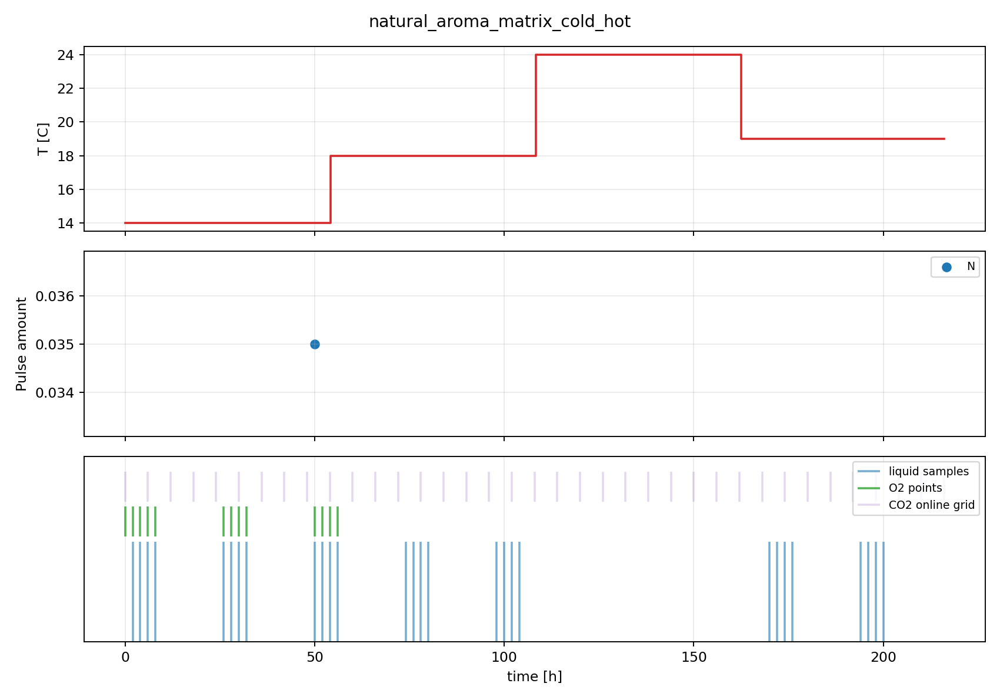

secondary_joint_inputs_natural_cold_hot_switch.png


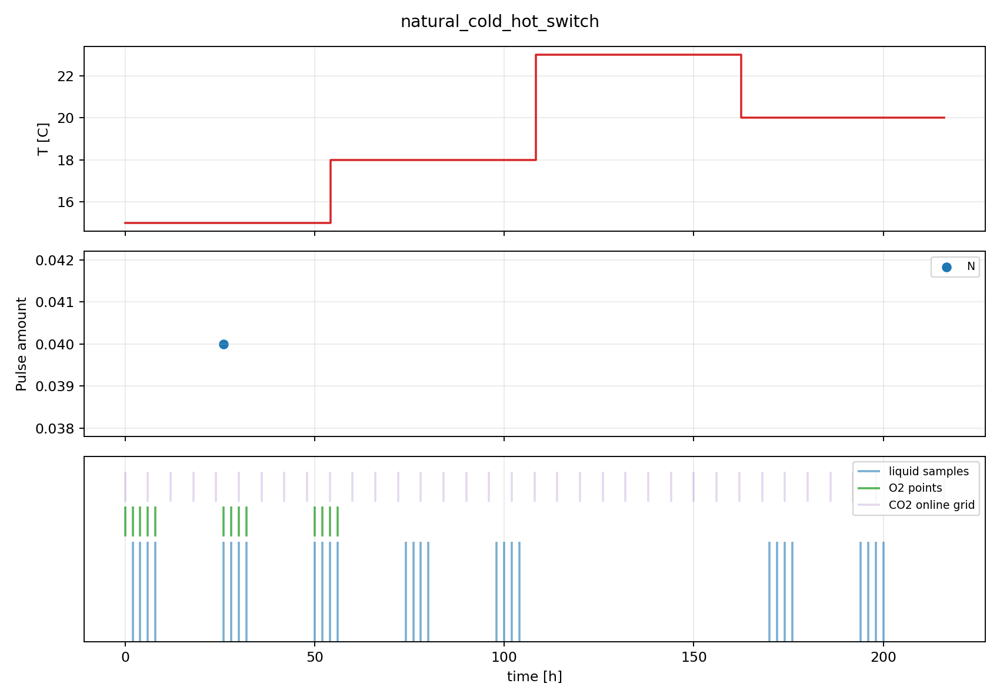

secondary_joint_inputs_natural_glucose_pulse_after_growth.png


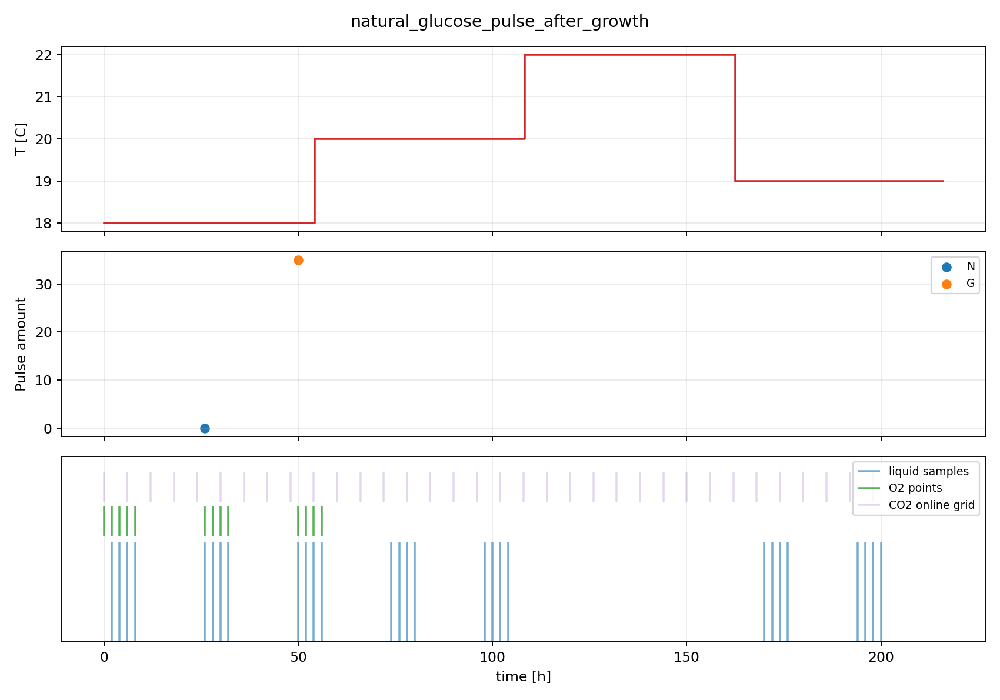

secondary_joint_inputs_synthetic_ethanol_inhibition_challenge.png


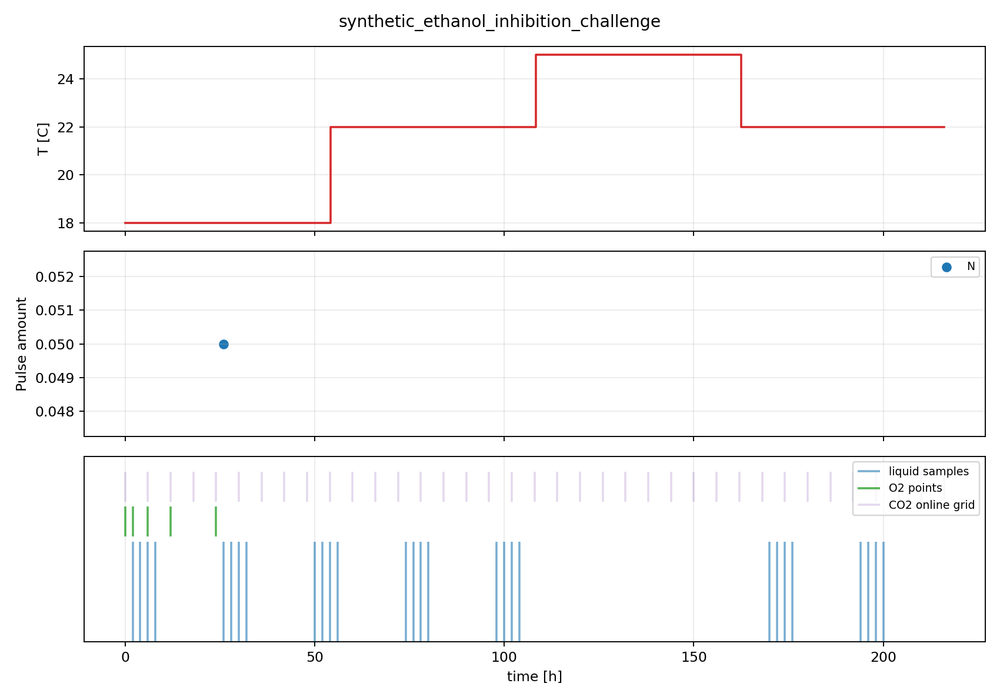

secondary_joint_inputs_synthetic_fructose_rich_glucose_pulse.png


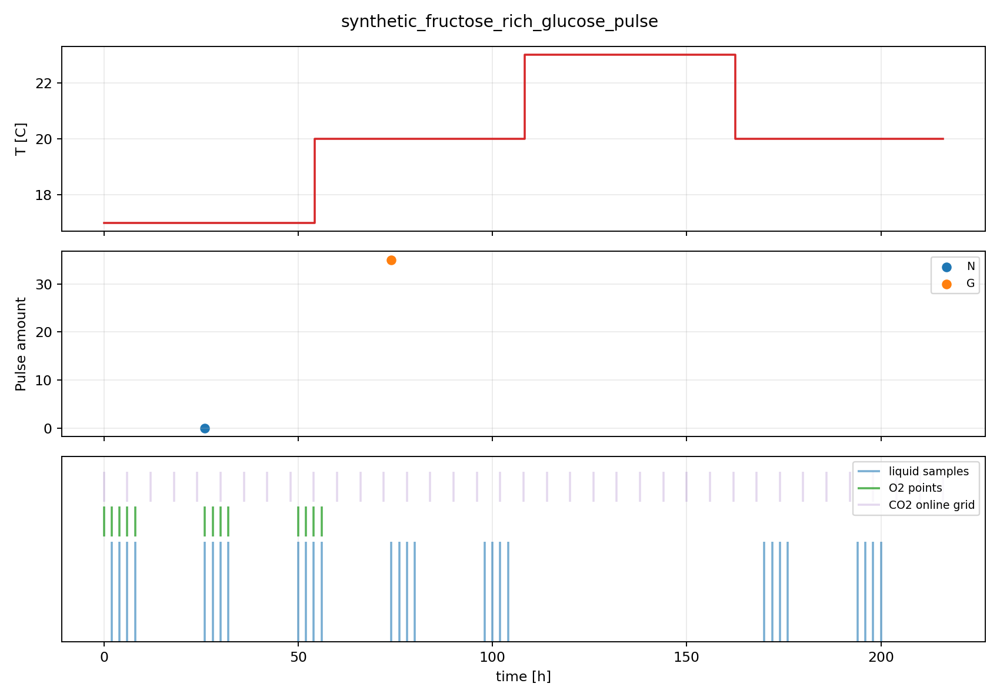

secondary_joint_inputs_synthetic_glucose_rich_fructose_pulse.png


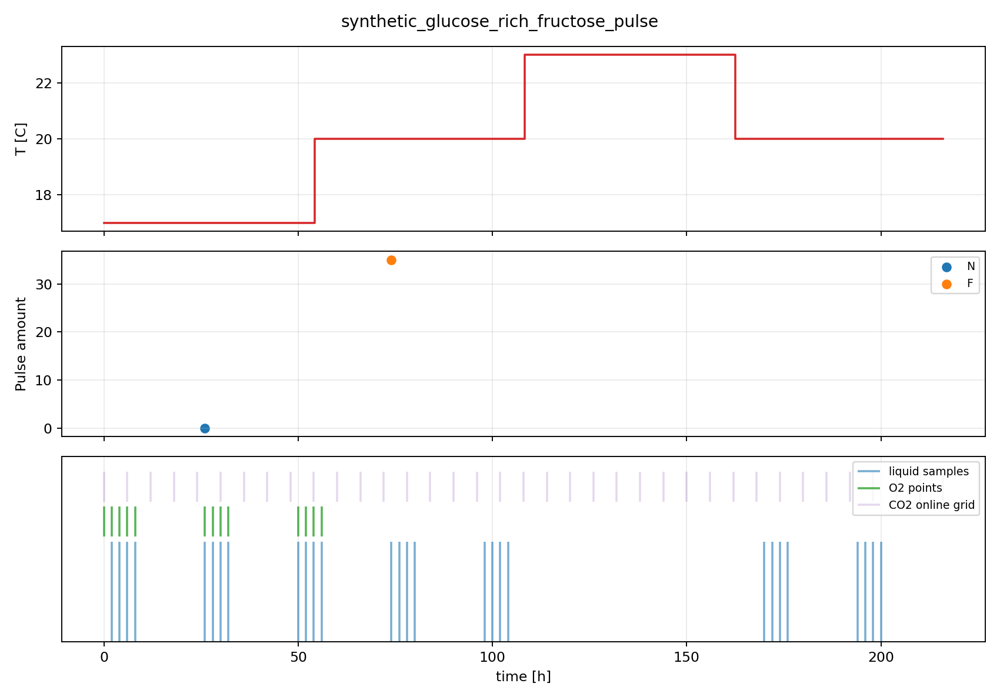

secondary_joint_inputs_synthetic_high_biomass_low_N_maintenance.png


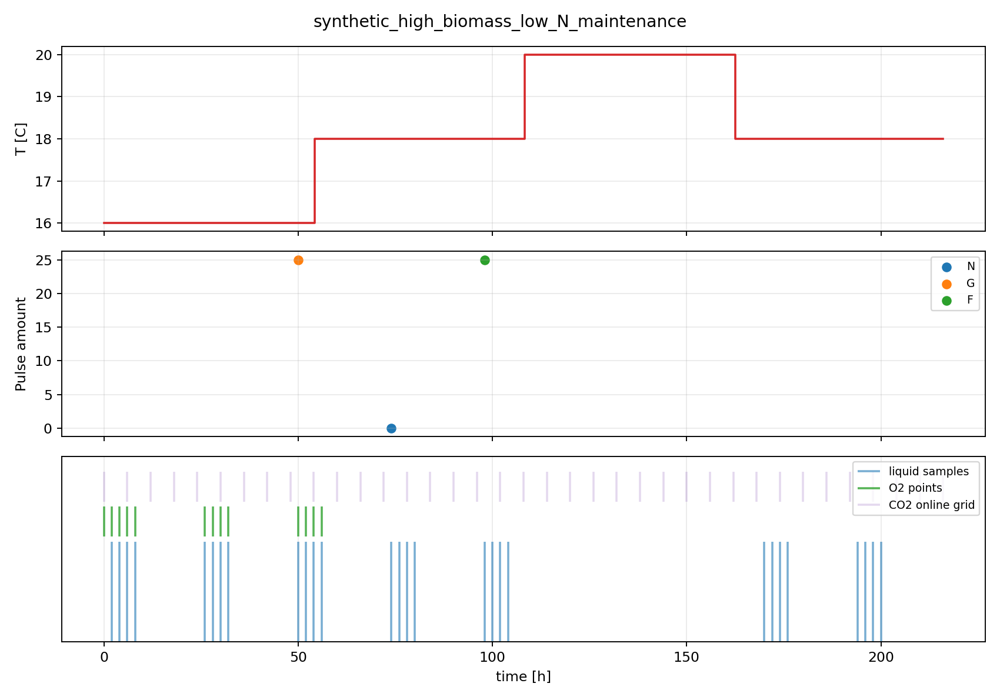

secondary_joint_inputs_synthetic_high_sugar_reference.png


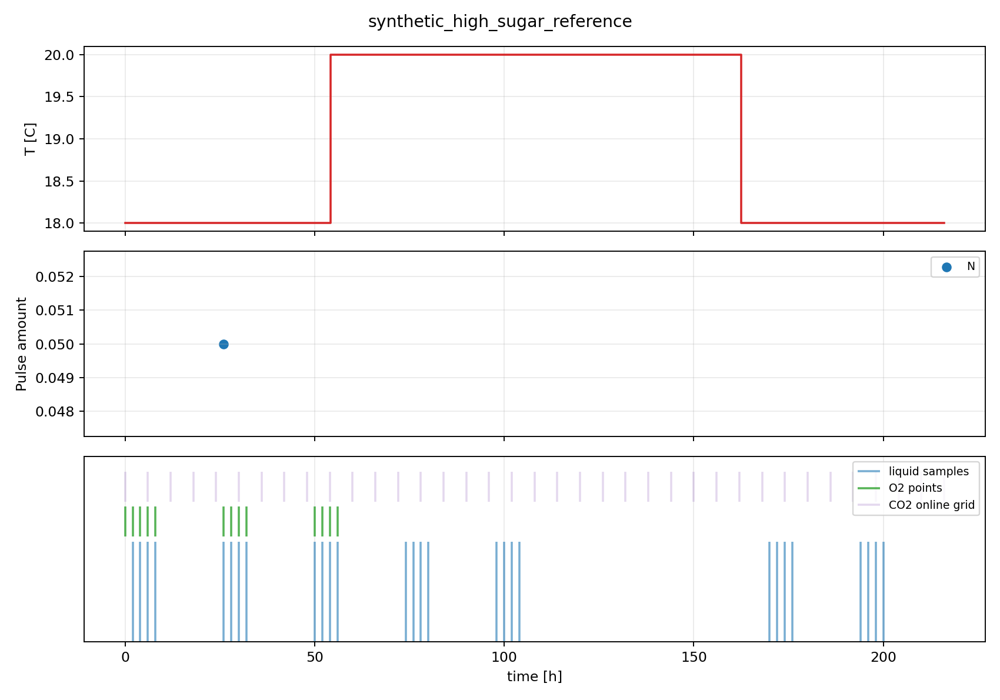

secondary_joint_inputs_synthetic_pyruvate_peak_lowN_warm_shift.png


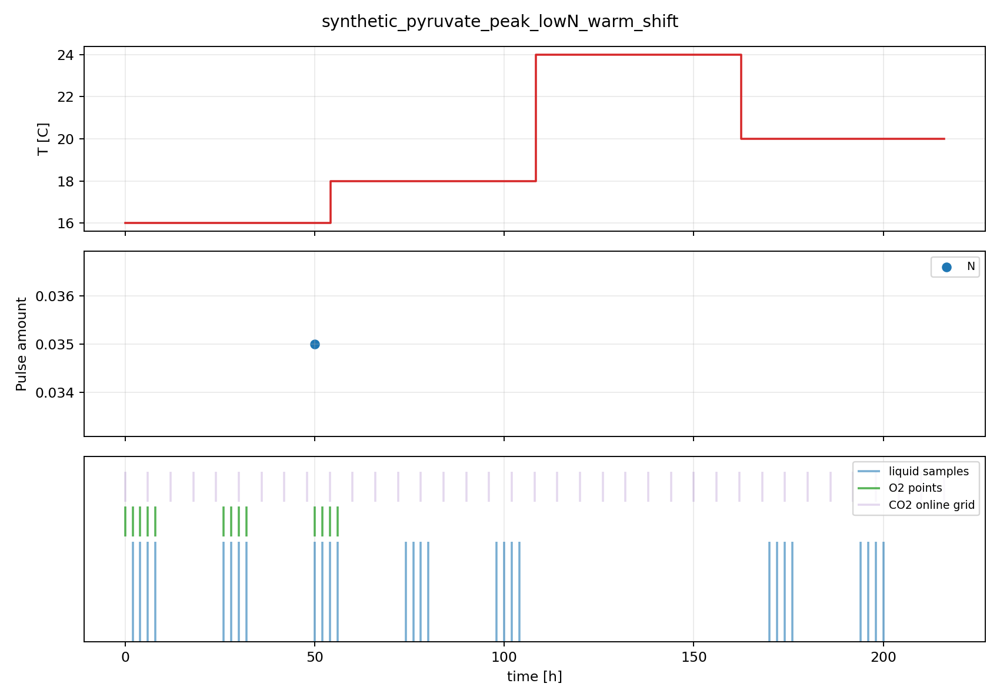

secondary_joint_inputs_synthetic_viable_biomass_step.png


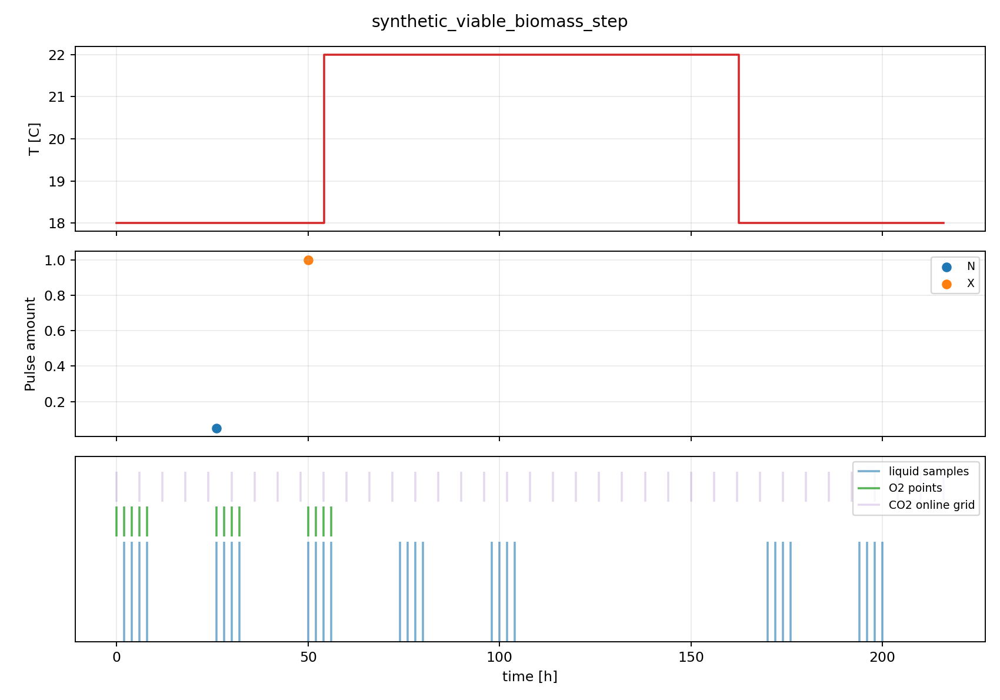

In [5]:
for png in sorted((RESULTS / 'plots').glob('secondary_joint_inputs_*.png')):
    print(png.name)
    display(Image(filename=str(png)))

## Current-fit plots

secondary_current_fit_historical_vl3_25026.png


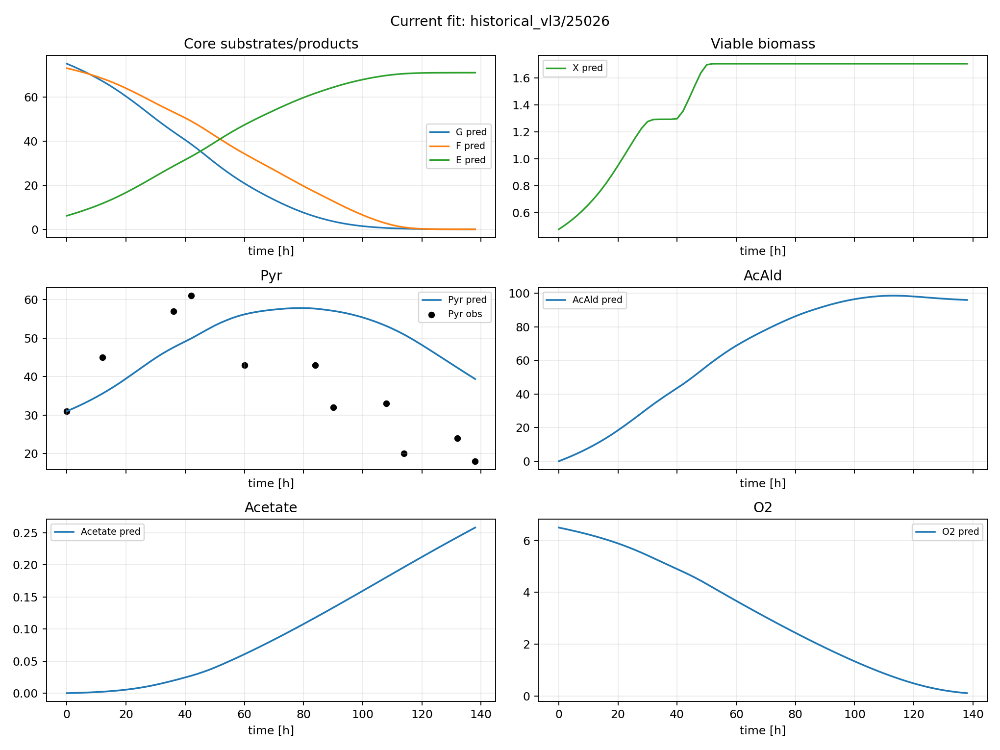

secondary_current_fit_historical_vl3_25027.png


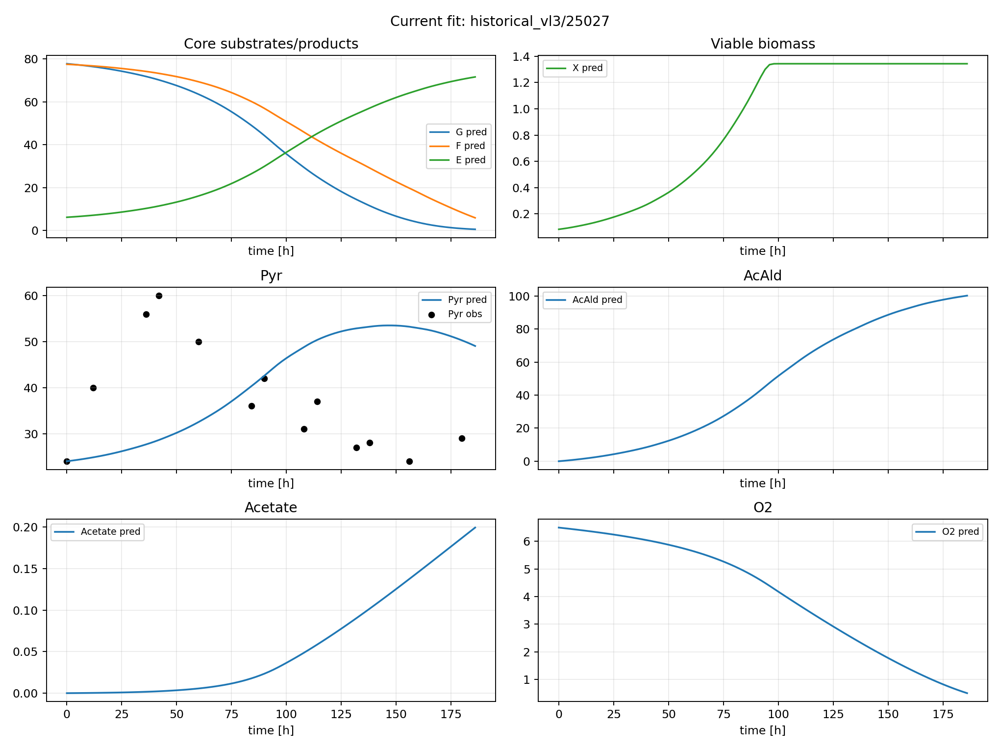

secondary_current_fit_historical_vl3_25085.png


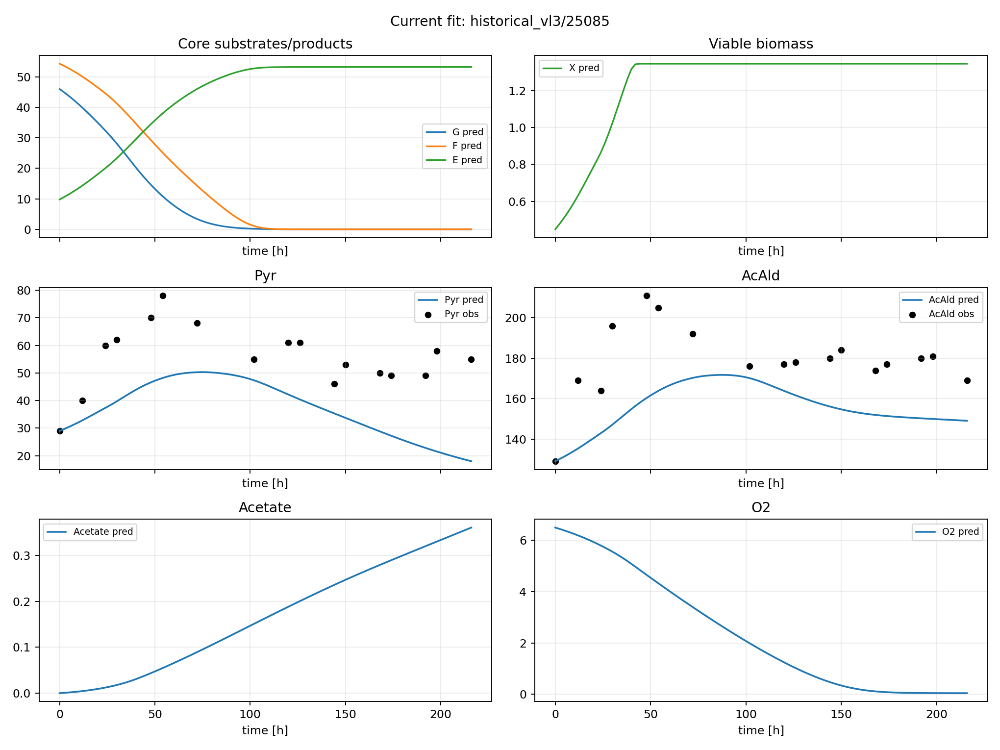

secondary_current_fit_historical_vl3_25086.png


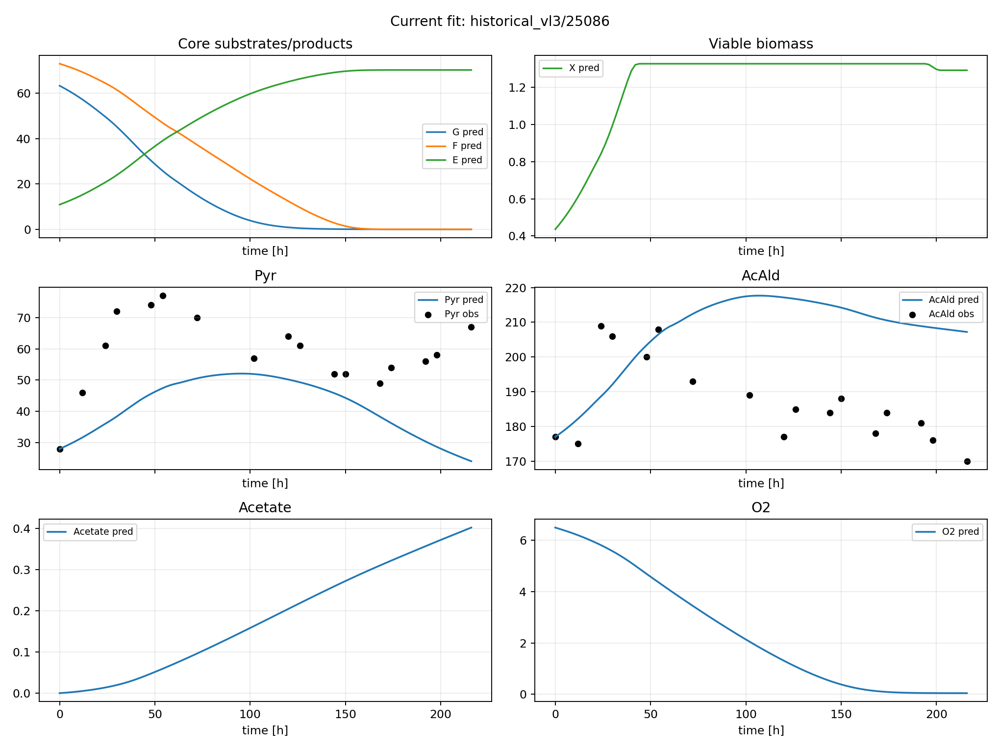

secondary_current_fit_historical_vl3_25150.png


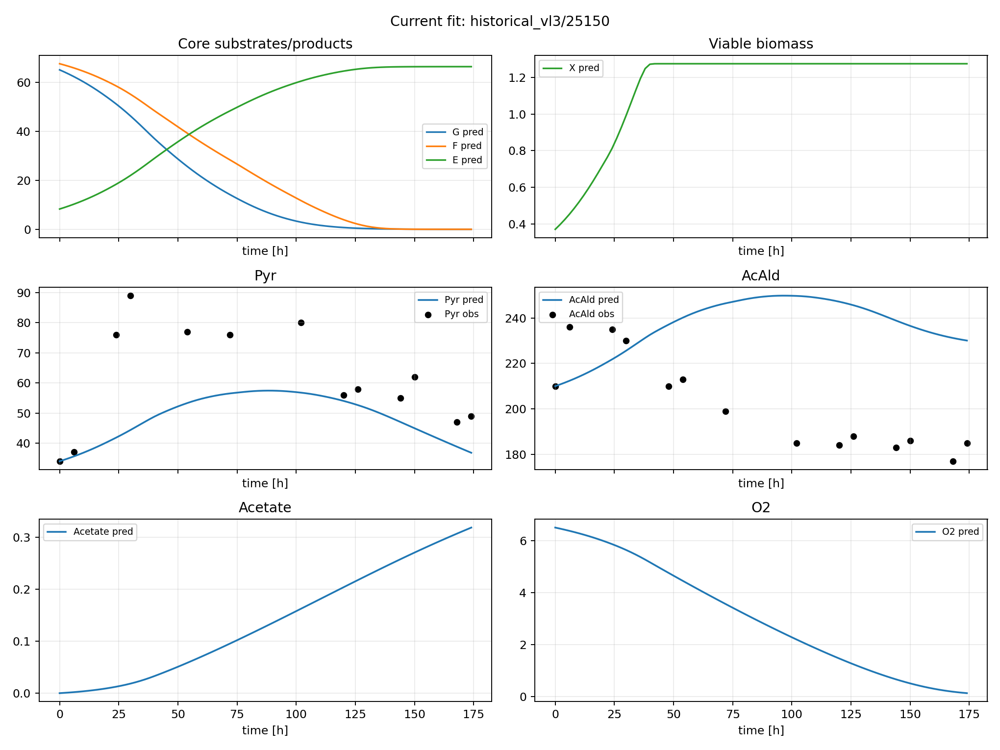

secondary_current_fit_historical_vl3_25151.png


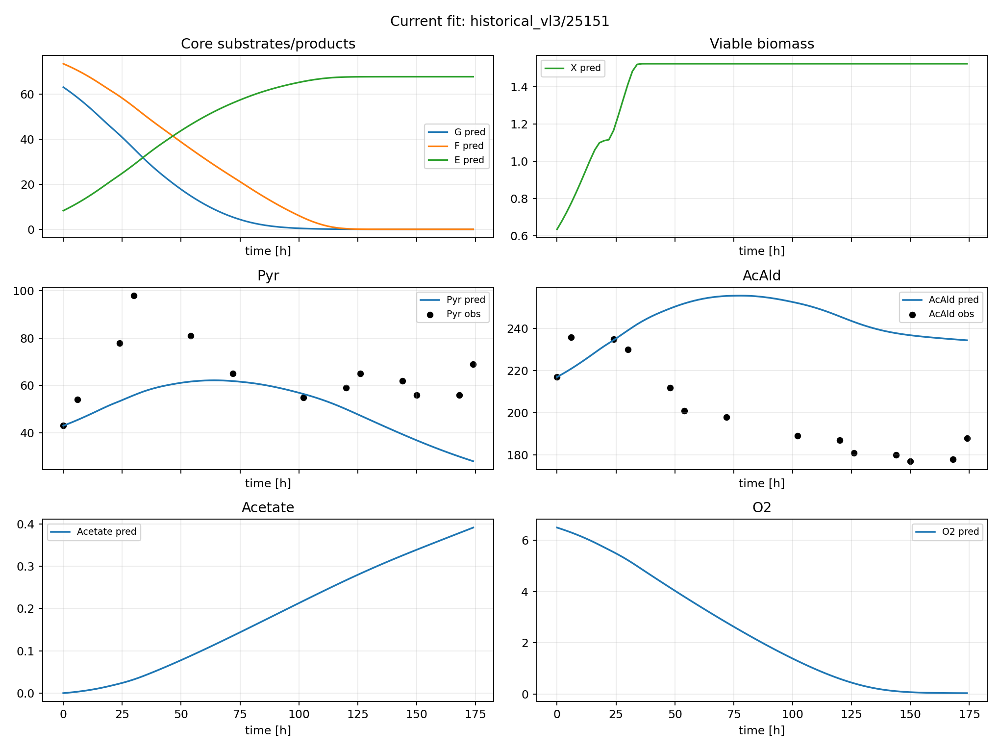

secondary_current_fit_historical_vl3_25170.png


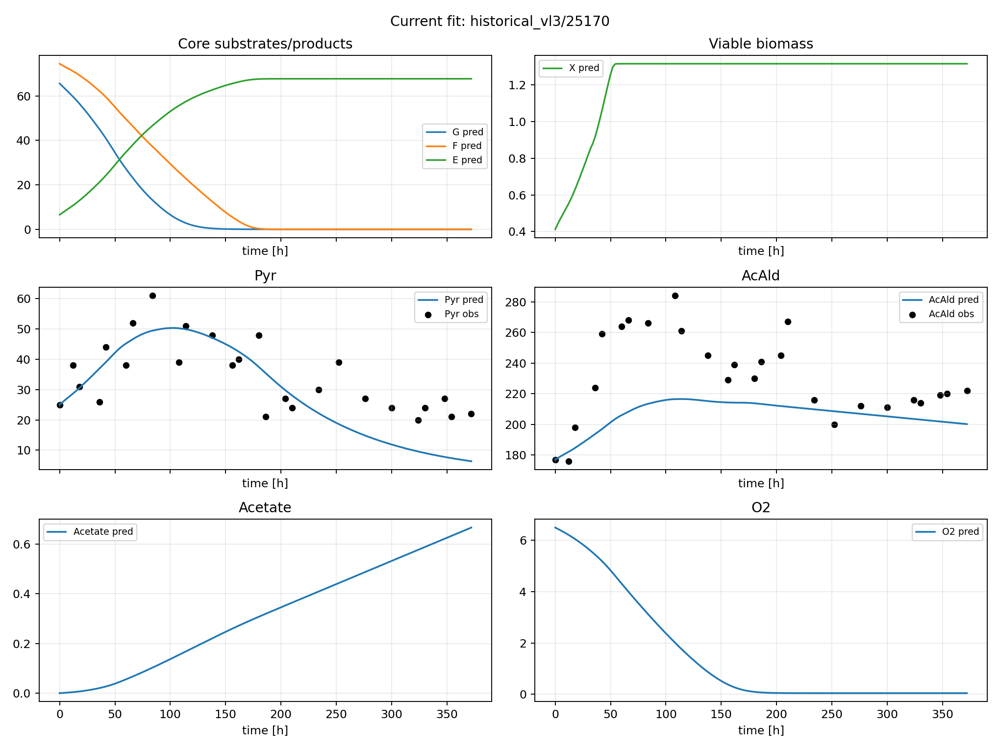

secondary_current_fit_historical_vl3_25171.png


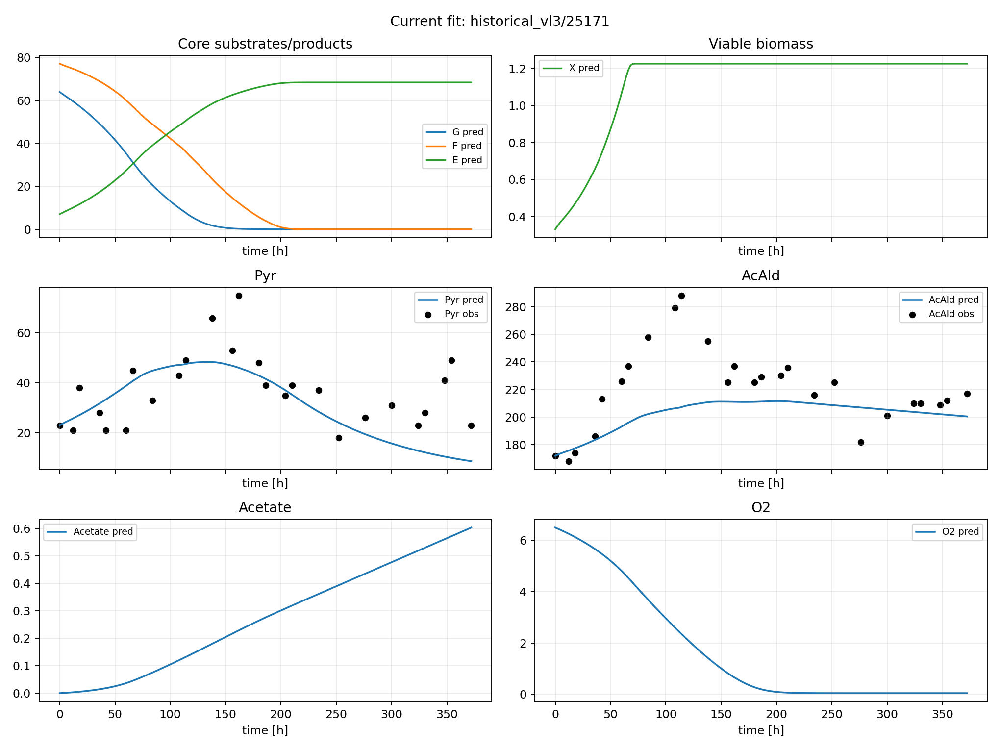

secondary_current_fit_natural_LAB004.png


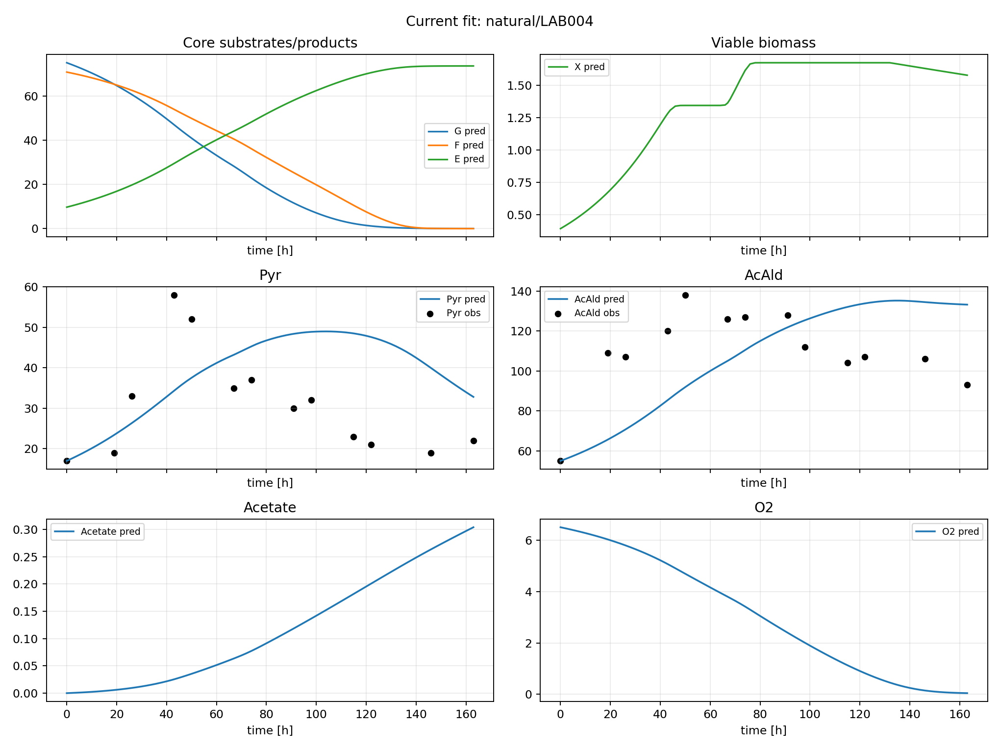

secondary_current_fit_natural_LAB005.png


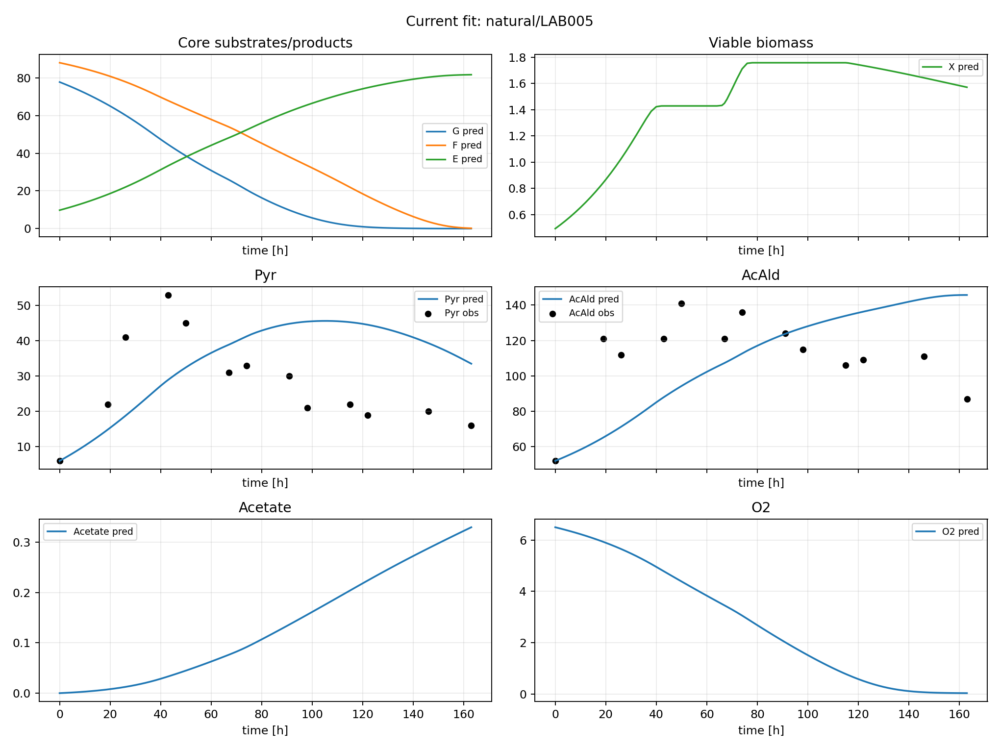

secondary_current_fit_natural_LAB006.png


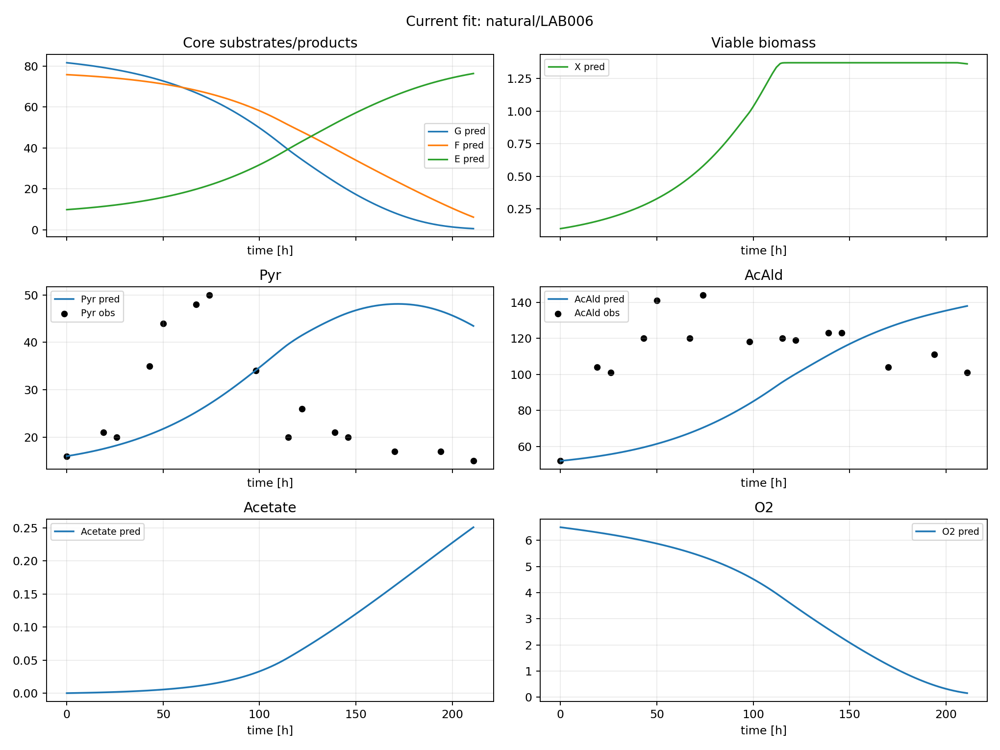

secondary_current_fit_natural_LAB007.png


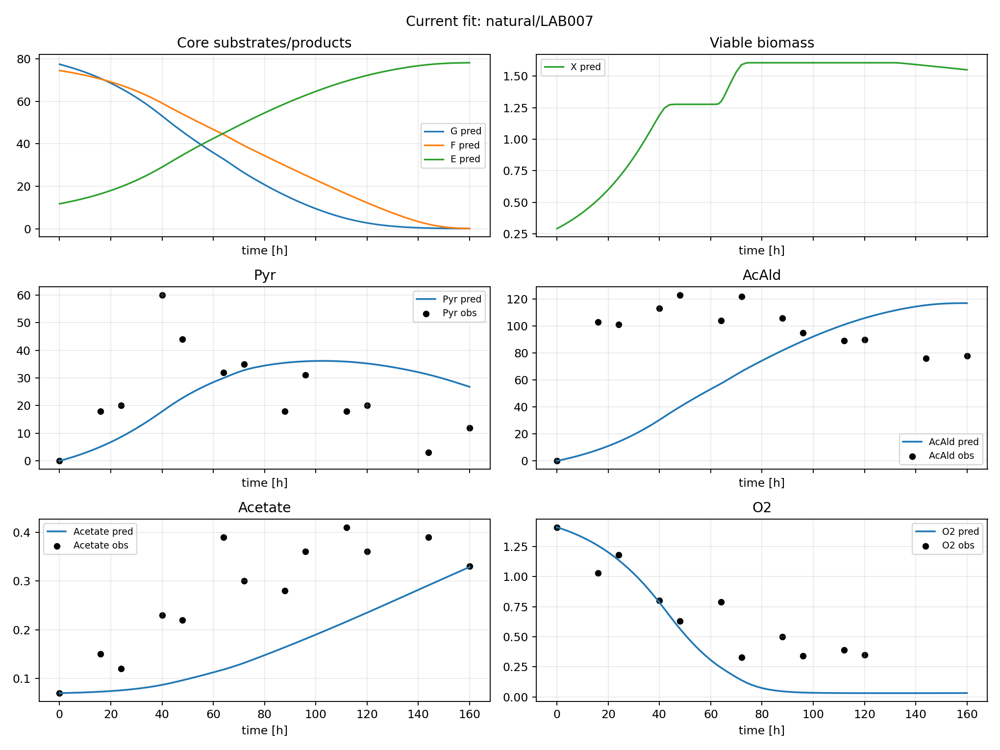

secondary_current_fit_natural_LAB008.png


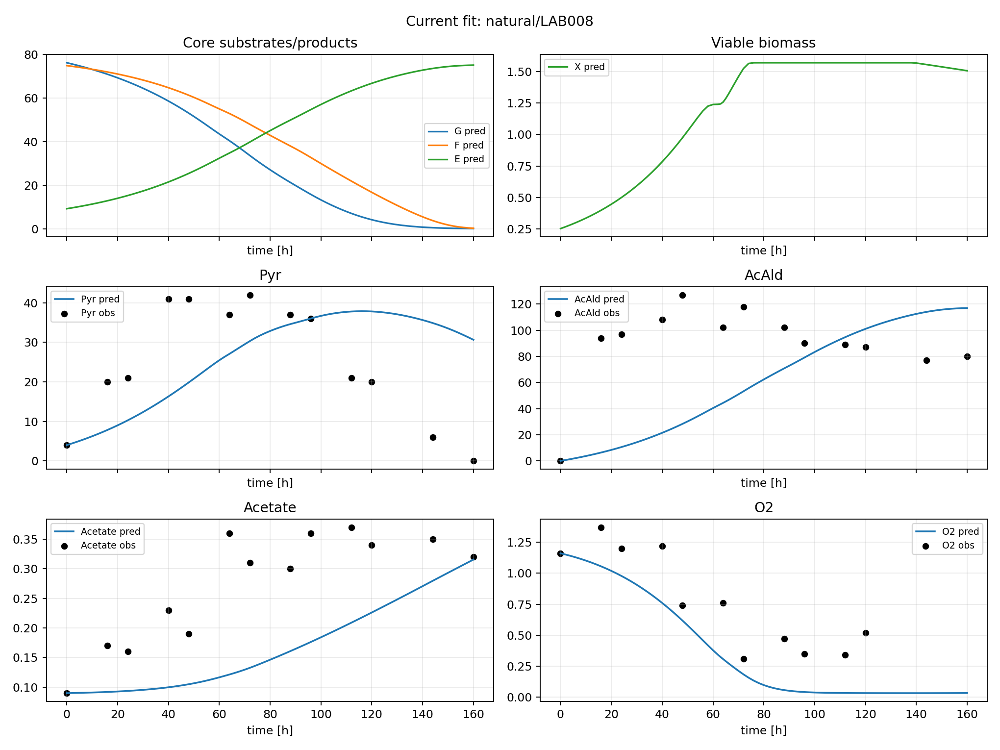

secondary_current_fit_natural_LAB009.png


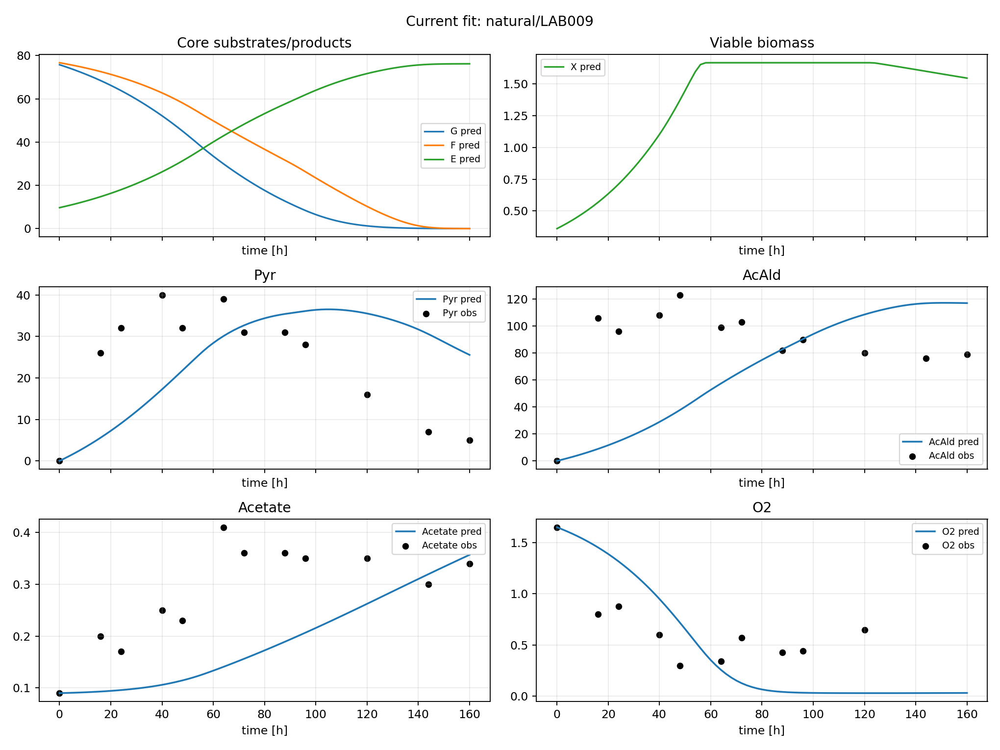

secondary_current_fit_natural_LAB010.png


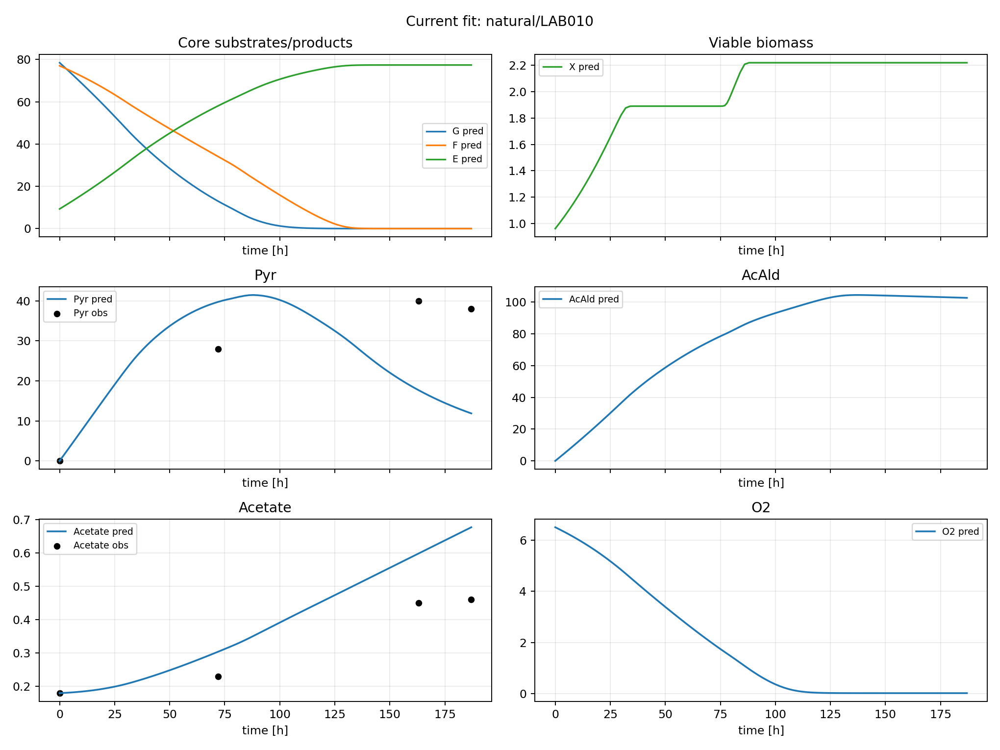

secondary_current_fit_natural_LAB011.png


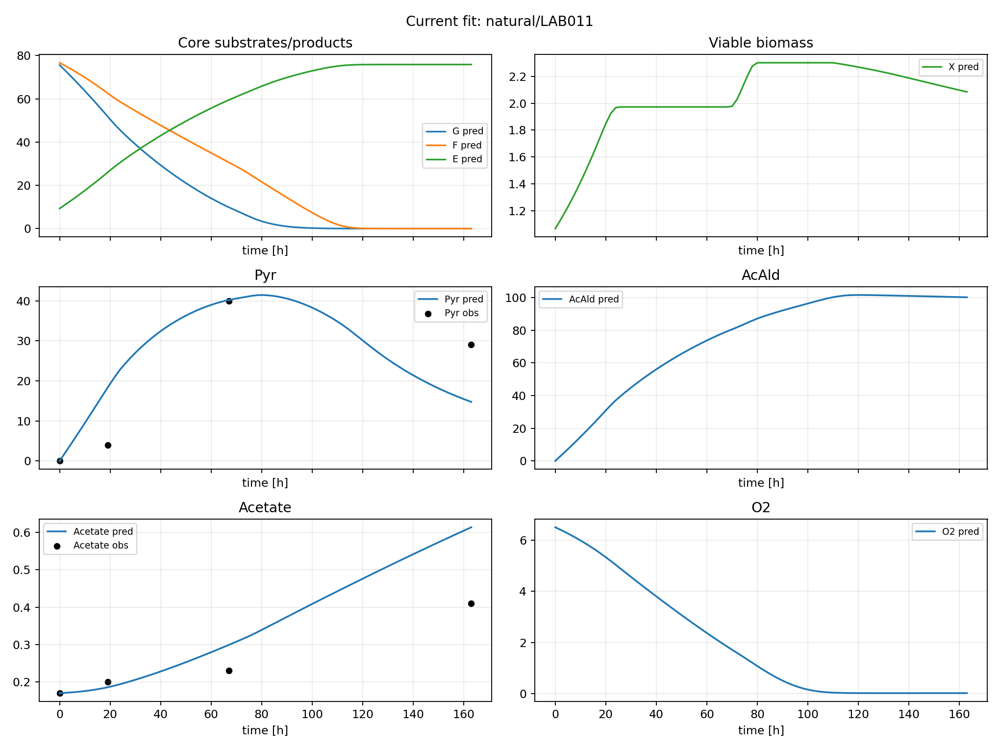

secondary_current_fit_natural_LAB012.png


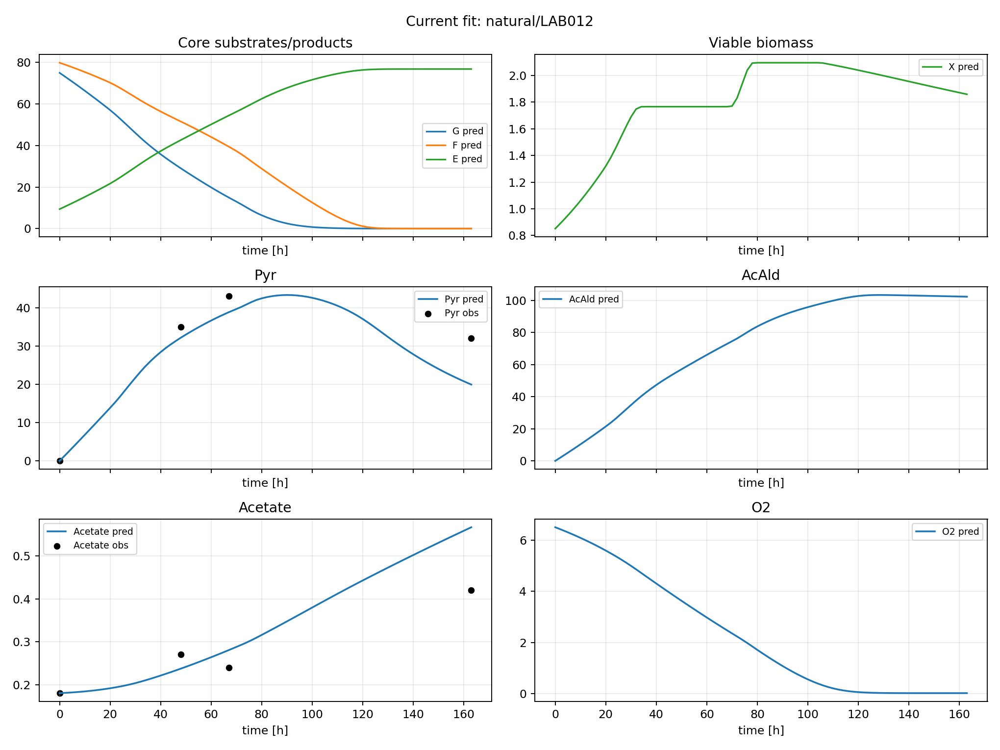

secondary_current_fit_synthetic_MS007.png


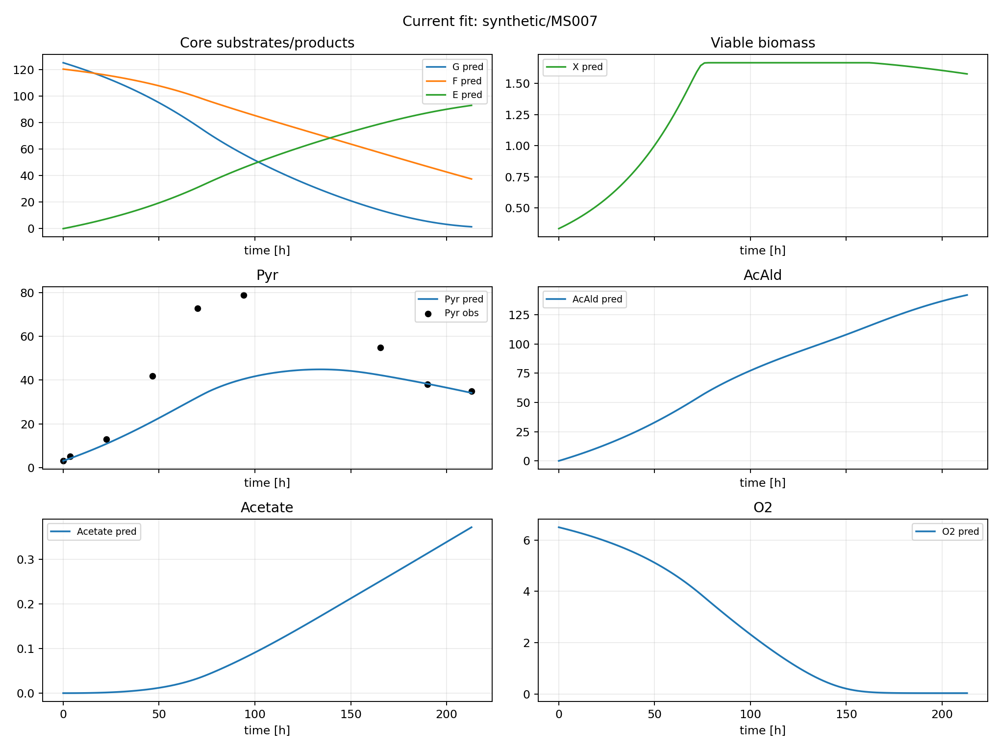

secondary_current_fit_synthetic_MS008.png


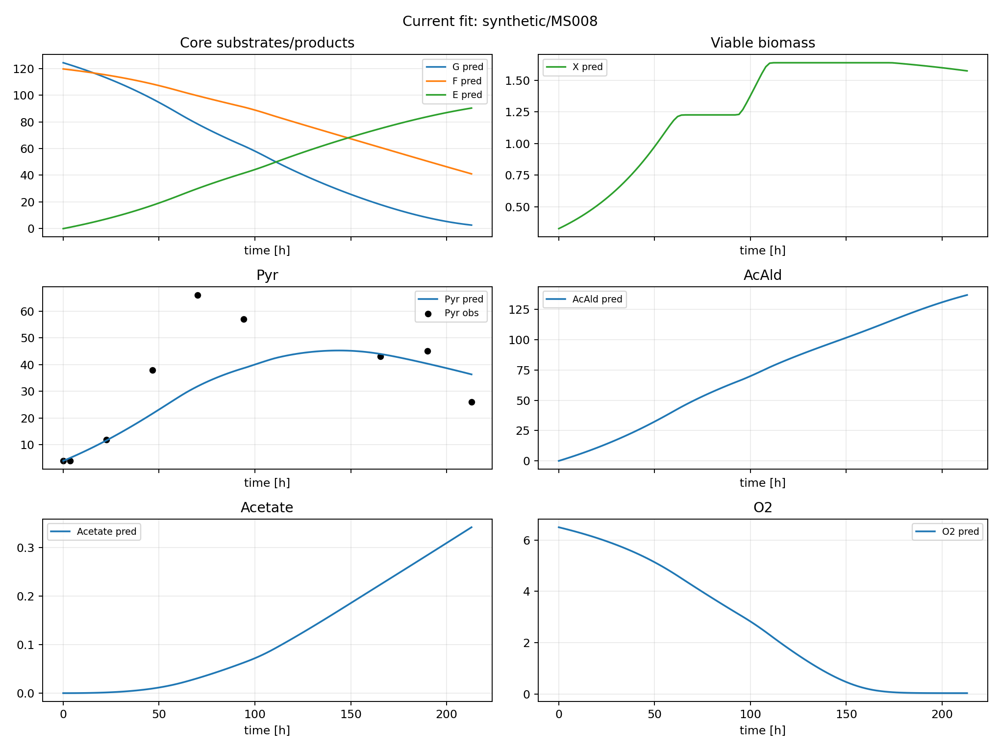

secondary_current_fit_synthetic_MS009.png


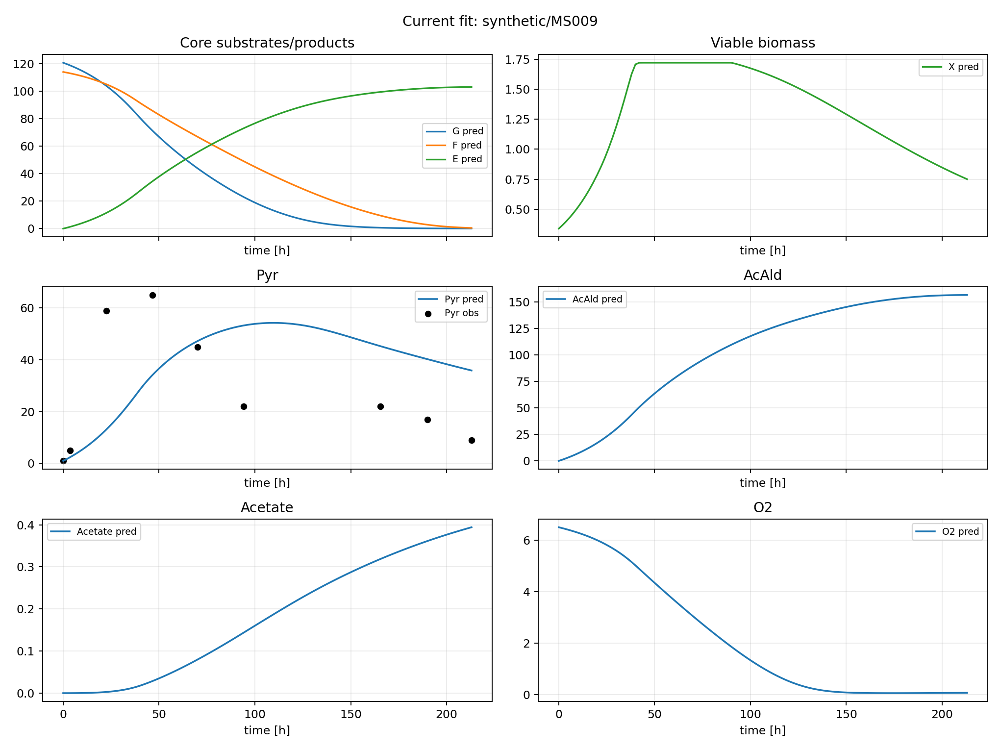

secondary_current_fit_synthetic_MS010.png


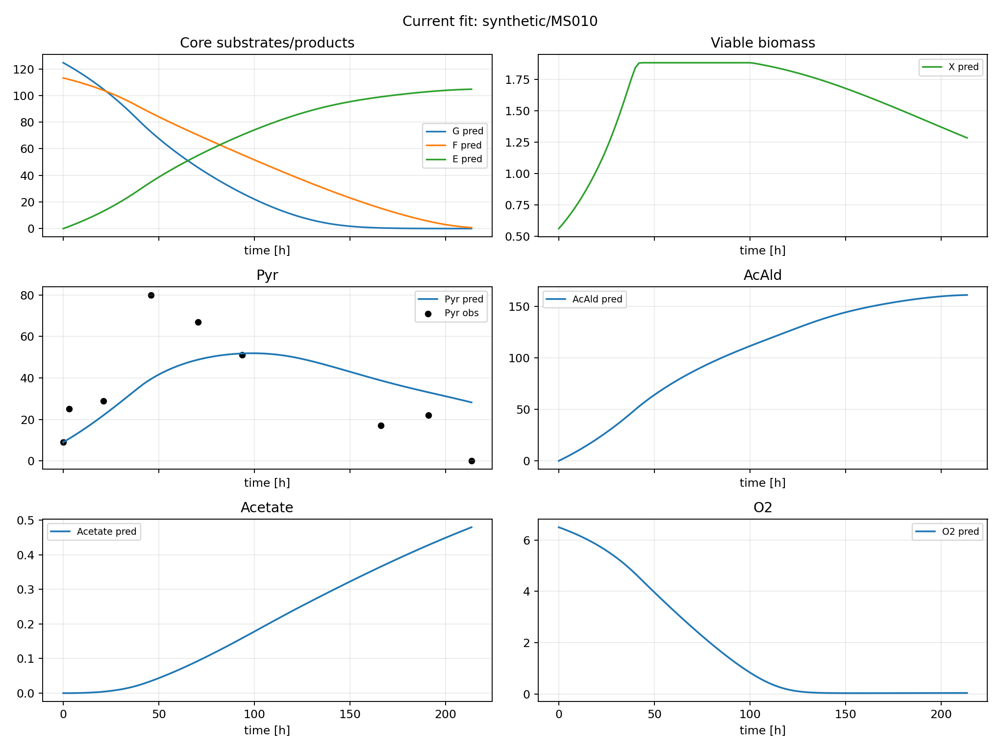

secondary_current_fit_synthetic_MS011.png


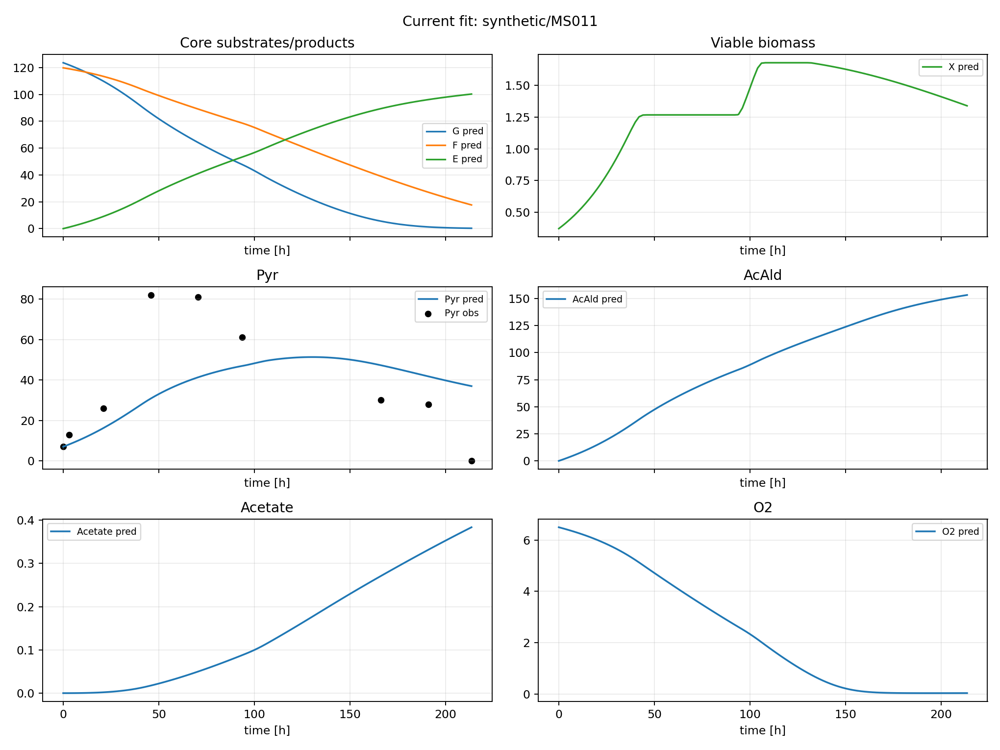

secondary_current_fit_synthetic_MS012.png


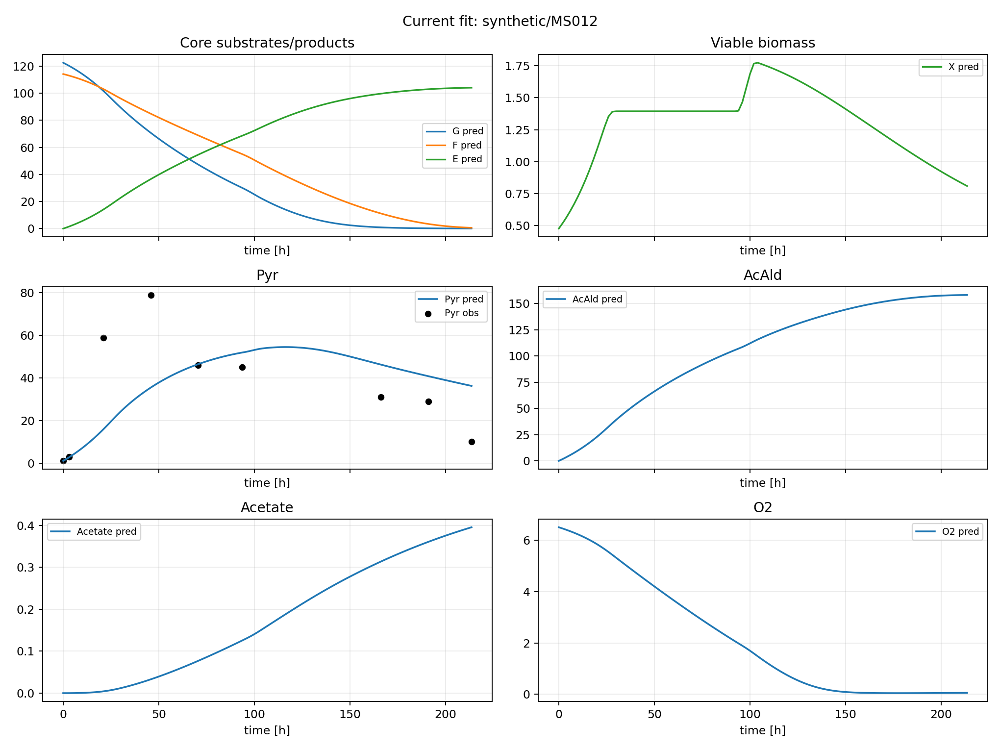

secondary_current_fit_synthetic_MS013.png


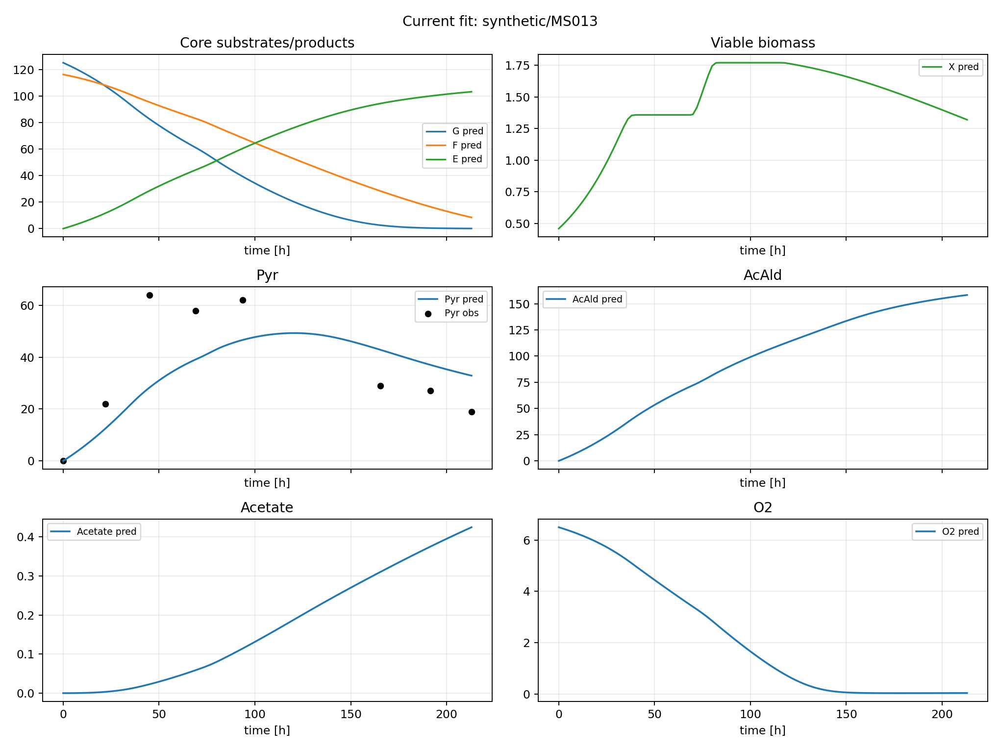

secondary_current_fit_synthetic_MS014.png


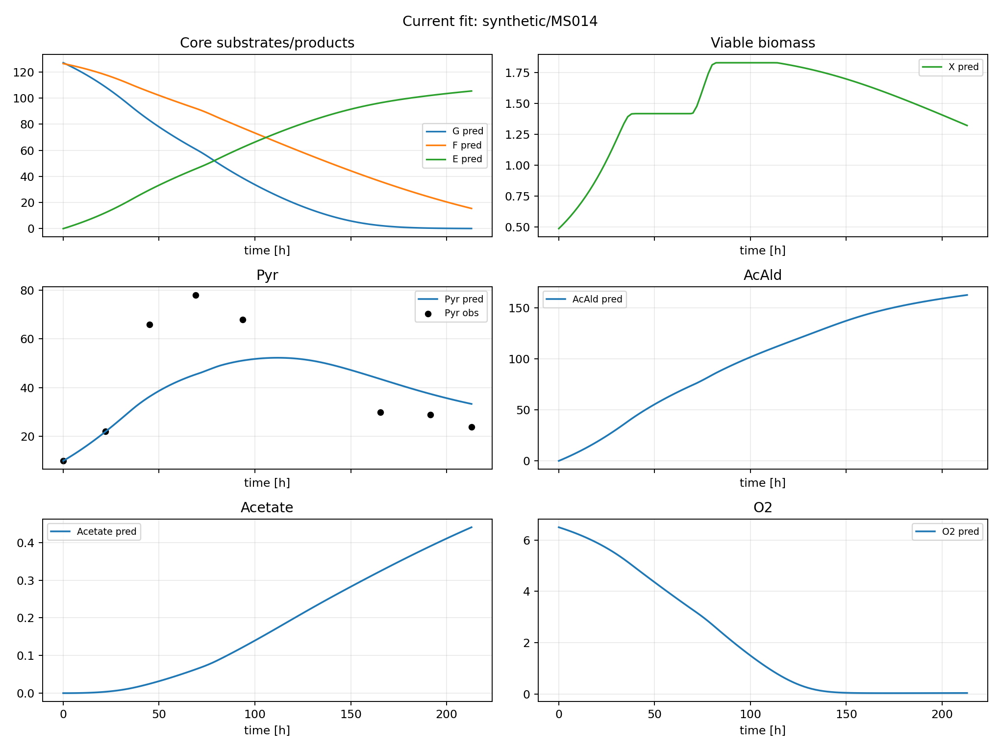

secondary_current_fit_synthetic_MS015.png


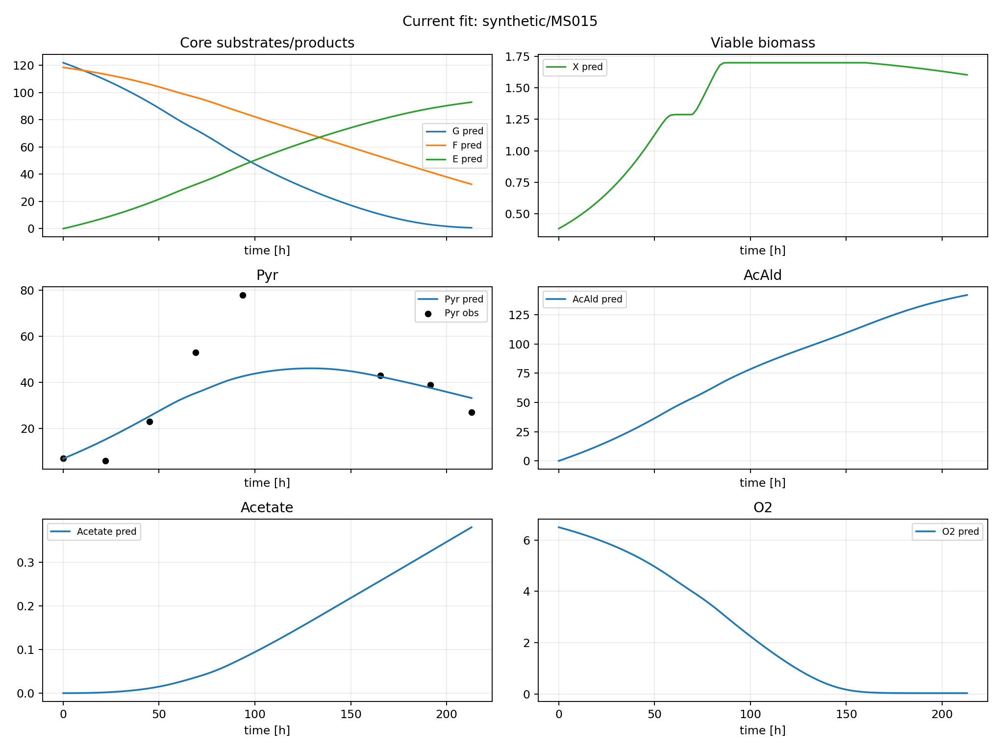

secondary_current_fit_synthetic_MS016.png


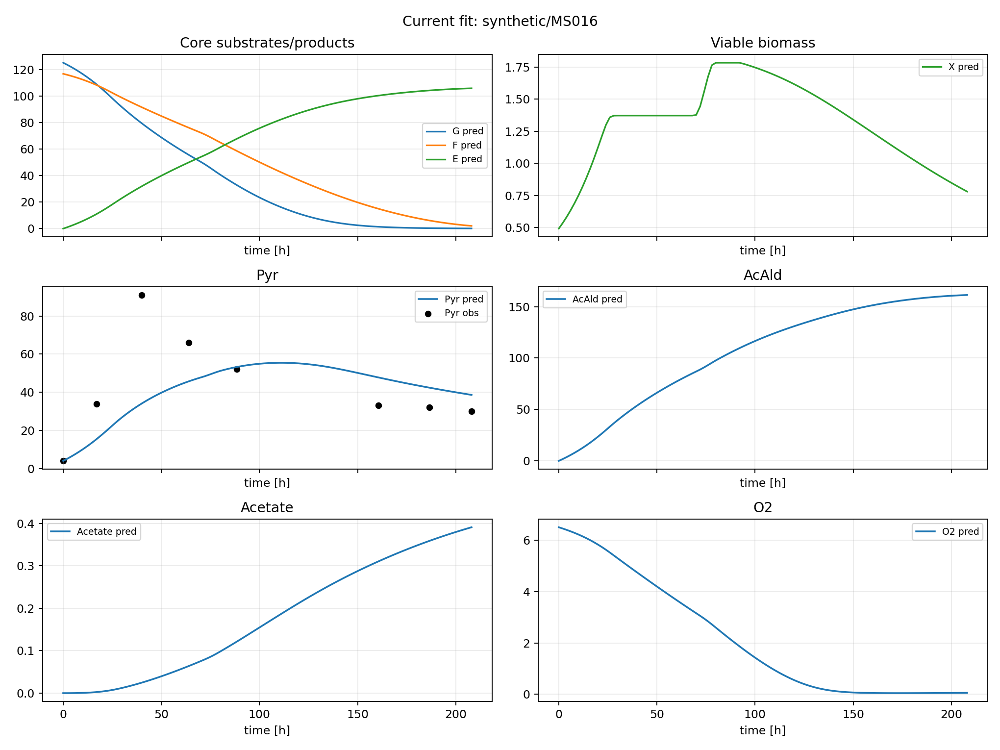

In [6]:
for png in sorted((RESULTS / 'plots').glob('secondary_current_fit_*.png')):
    print(png.name)
    display(Image(filename=str(png)))

## Predicted extended outputs

secondary_joint_prediction_natural_aroma_matrix_cold_hot.png


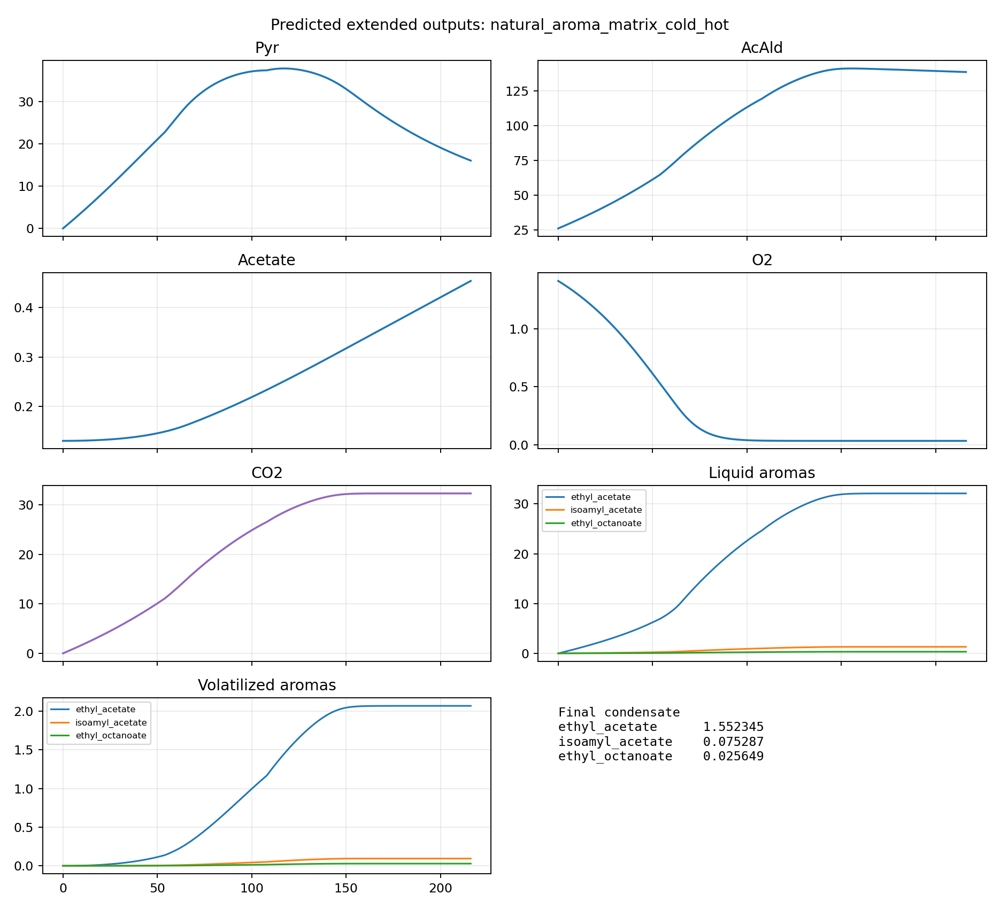

secondary_joint_prediction_natural_cold_hot_switch.png


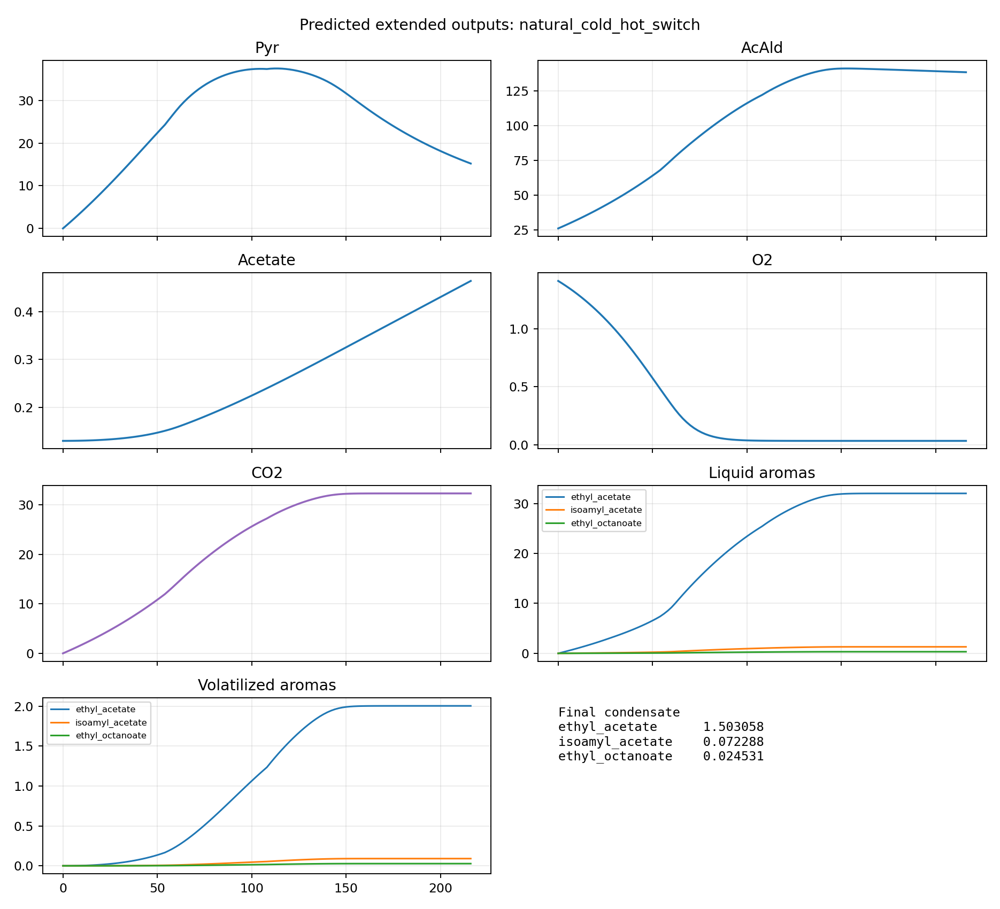

secondary_joint_prediction_natural_glucose_pulse_after_growth.png


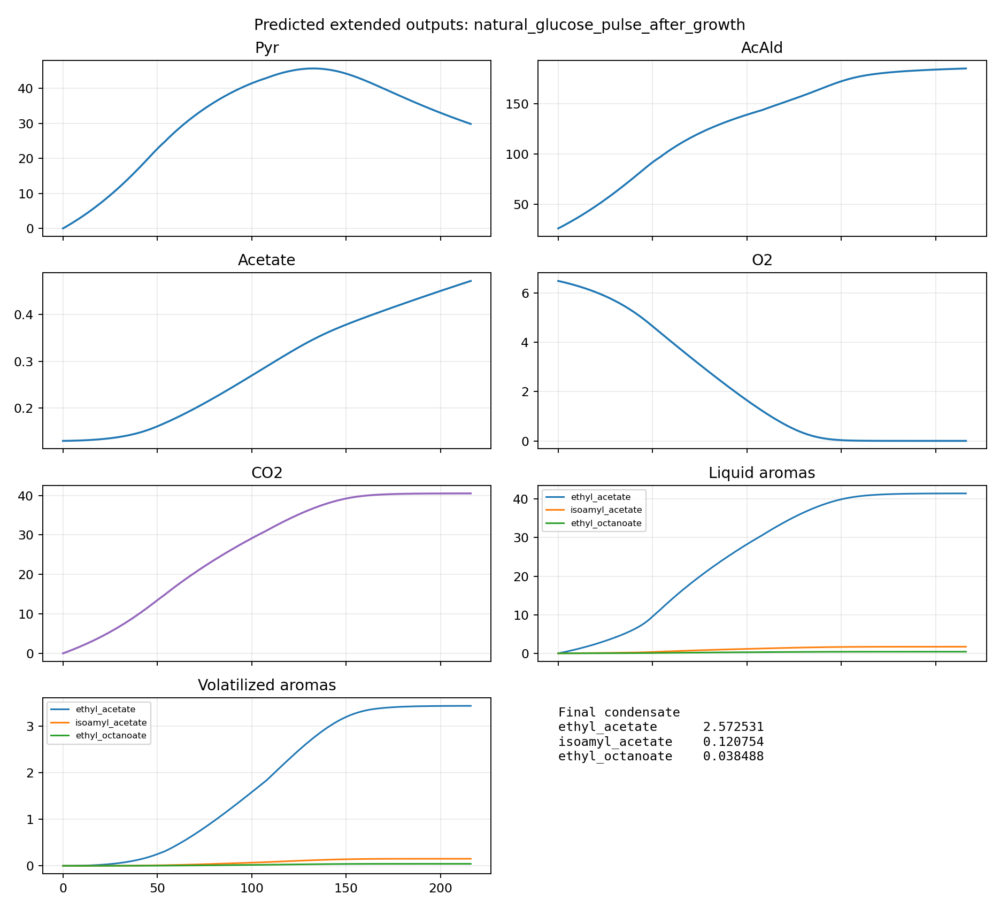

secondary_joint_prediction_synthetic_fructose_rich_glucose_pulse.png


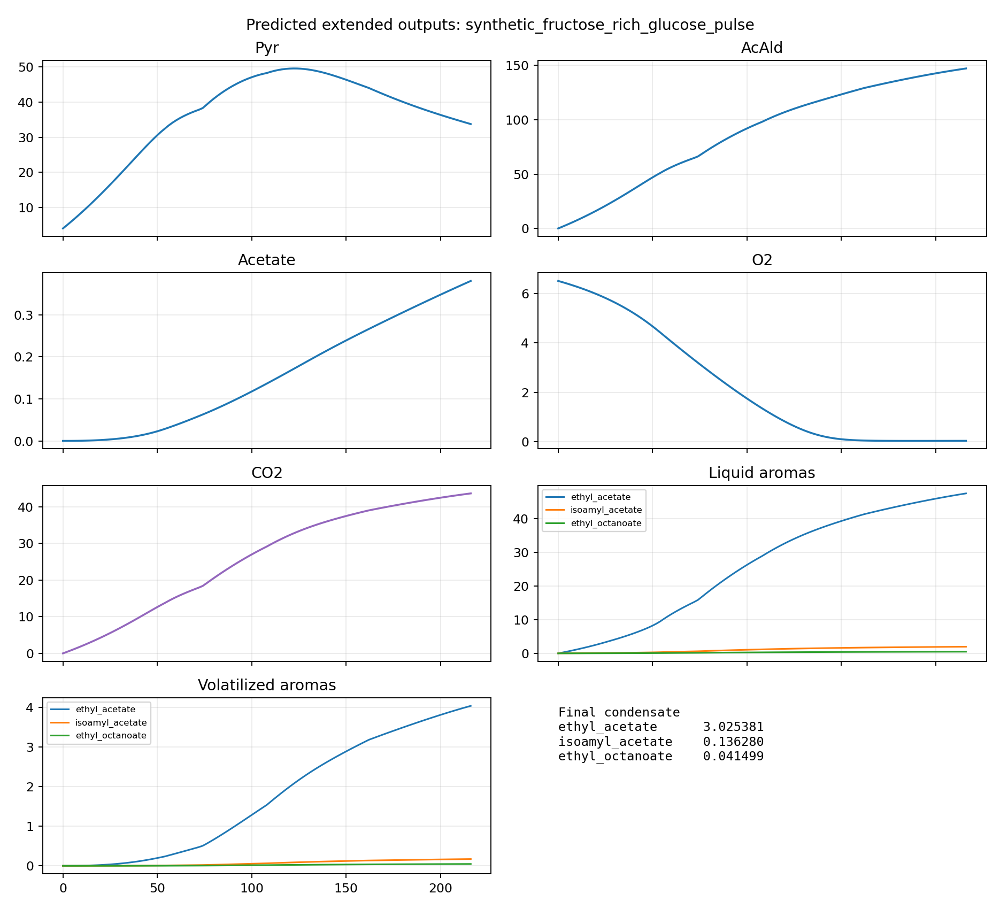

secondary_joint_prediction_synthetic_glucose_rich_fructose_pulse.png


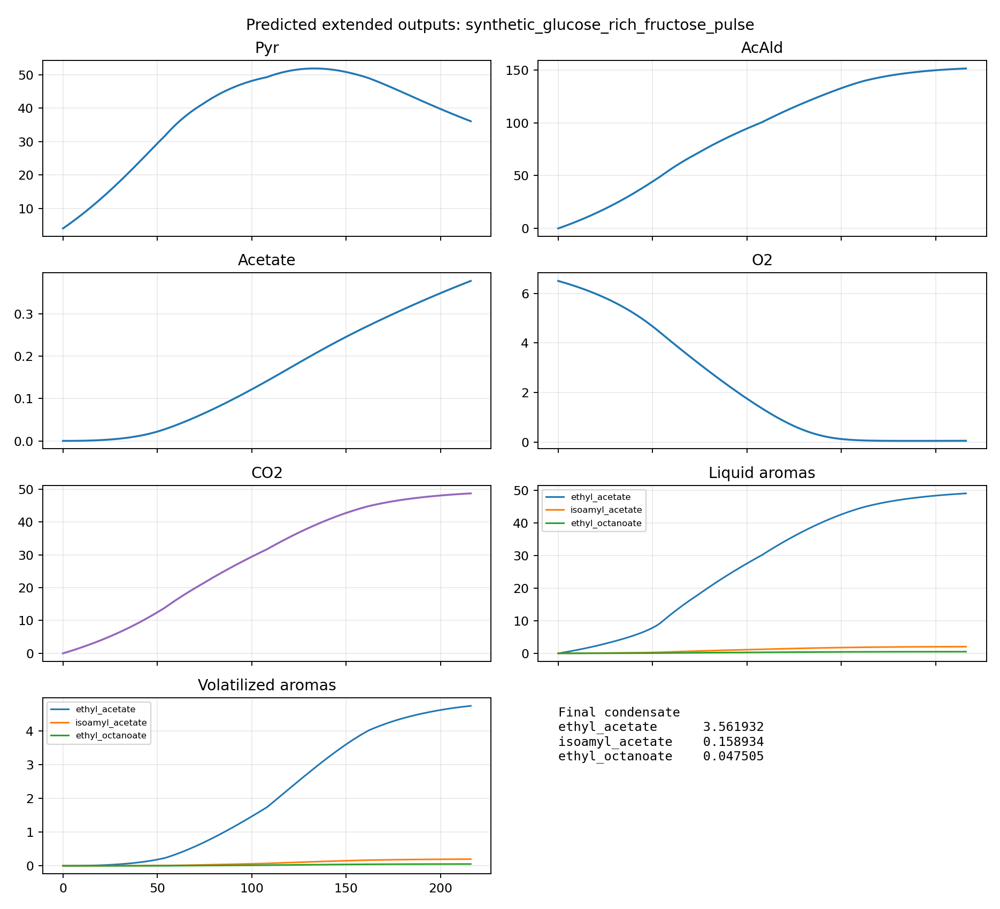

secondary_joint_prediction_synthetic_high_biomass_low_N_maintenance.png


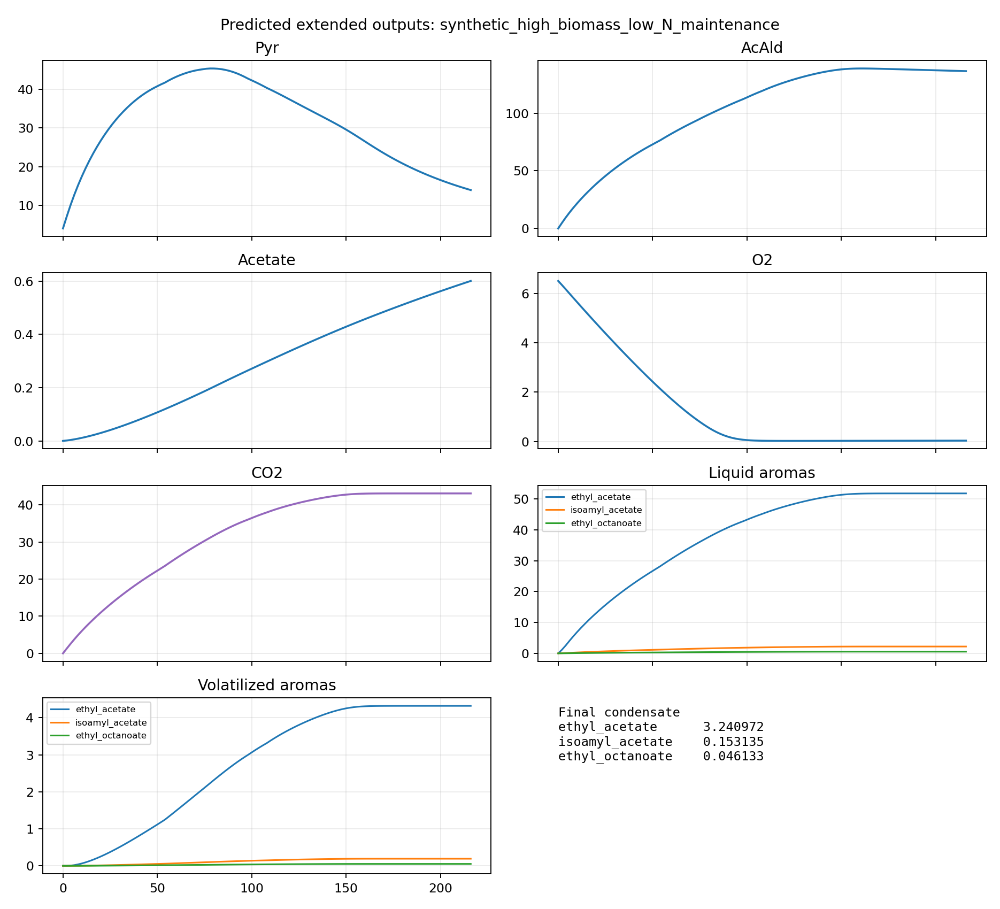

secondary_joint_prediction_synthetic_high_sugar_reference.png


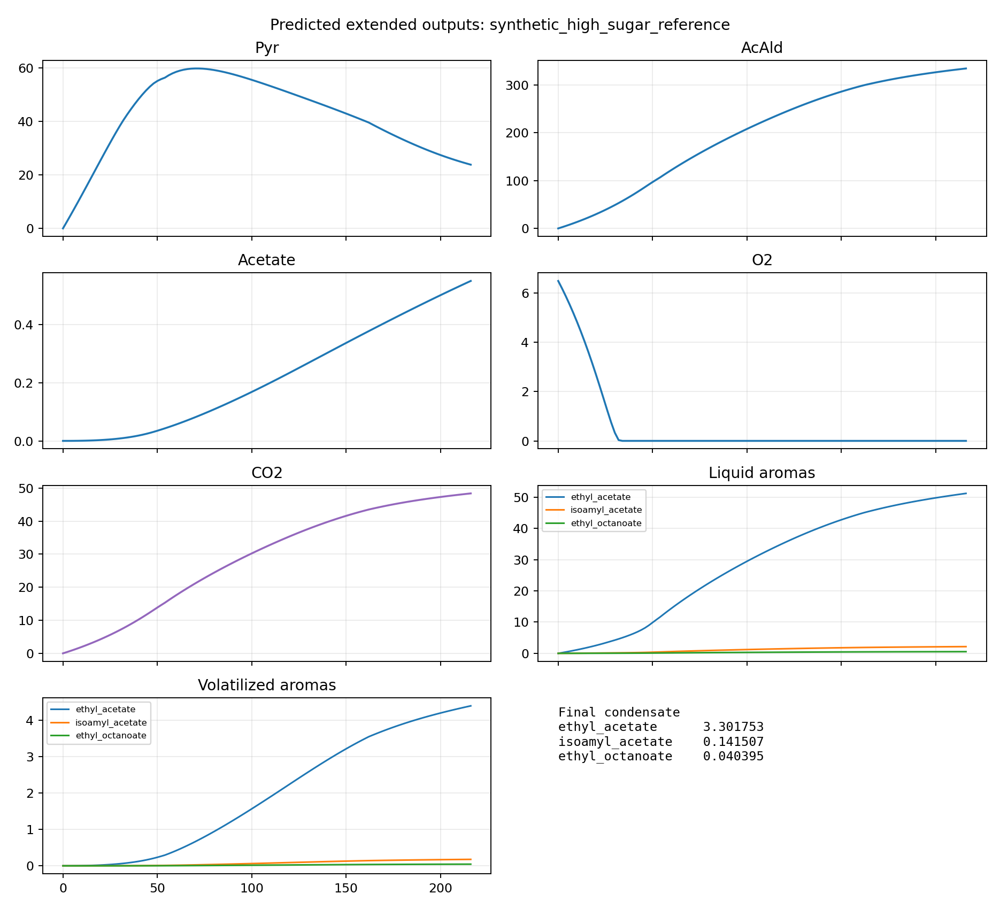

secondary_joint_prediction_synthetic_viable_biomass_step.png


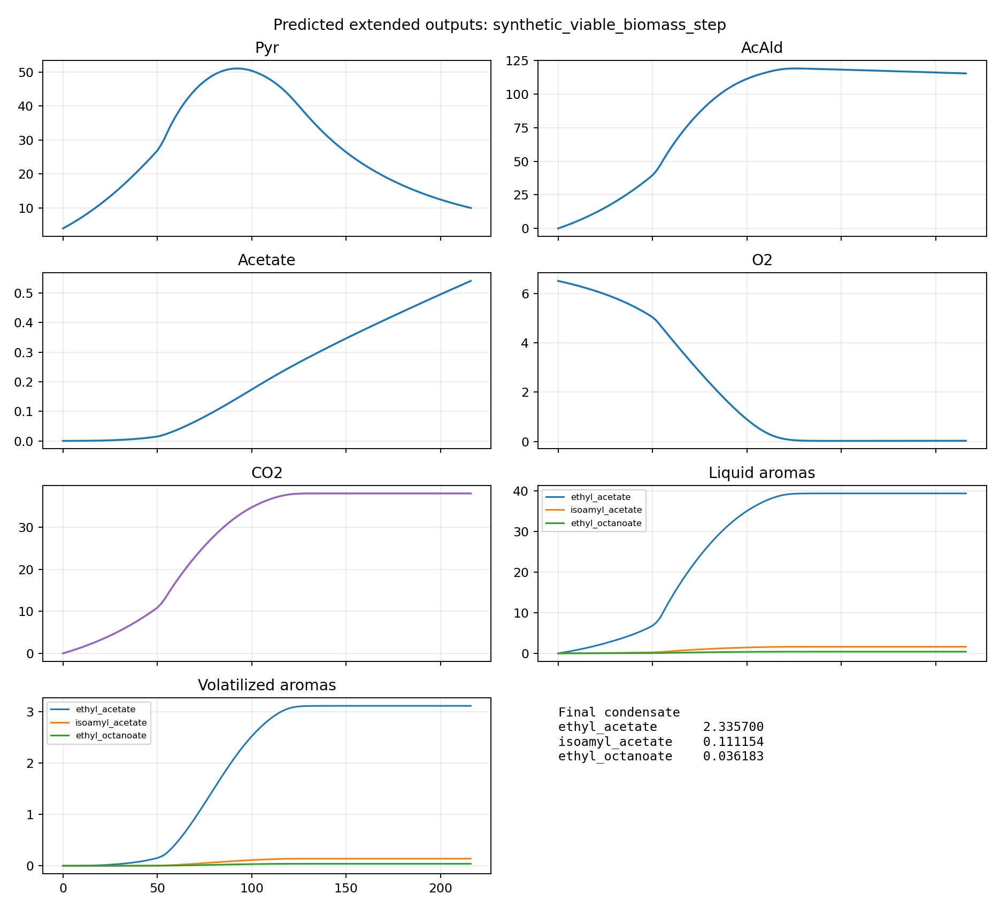

In [7]:
for png in sorted((RESULTS / 'plots').glob('secondary_joint_prediction_*.png')):
    print(png.name)
    display(Image(filename=str(png)))

## Report

In [8]:
print((RESULTS / 'secondary_joint_campaign_report.md').read_text(encoding='utf-8'))

# Secondary-state joint campaign DOE

## Scope

This run extends the current glycerol model with pyruvate, acetaldehyde, acetate, dissolved oxygen exposure, CO2, and liquid/condensate aroma outputs.

Oxygen is not treated as a manipulated design input. Existing DO measurements are used as direct O2 observations, and future DO points are scheduled on the operational early-time grid because the lab cannot deliver a reliable oxygen pulse without extra experimental work.

Final condensate is used as an integral volatilization constraint. Liquid aroma trajectories remain net liquid outputs, while alpha-loss parameters are regularized by literature/UNIFAC structure.

## Secondary fit

| fit                  | success   |   status | message                                    |   nfev |   initial_wsse |   final_wsse |   n_residuals |   wsse_per_residual |
|:---------------------|:----------|---------:|:-------------------------------------------|-------:|---------------:|-------------:|-------